# **Hair Loss Prediction**

# **Abstract**

>  **This dataset about hair loss prediction is based on some features. The hair loss prediction dataset contains various features related to a person's health and lifestyle, such as stress level, coffee consumption, hair grease usage, etc. These features can be used to predict the likelihood of a person experiencing hair loss, which can help doctors and hair specialists diagnose and treat their patients more effectively. The dataset is a valuable resource for researchers and practitioners in the field of hair loss treatment and prevention.**


# **Aim:**
In this assignment we aim to develop a complete ML project with


1.   Checking Data Quality by performing different EDA techniques
2.   Feature Selection
3.   Modeling - Training Models, Selecting Best Model, Hyperparameter Tuning
4.   Model Interpretibility
5.   Reports and Visualizations





## **Target Variable/Dependent Variable**
Hair_Loss - Is the person suffering from Hair Loss. This is the variable we have to predict using predictor variables/independent variables

# **Data Set**
**Kaggle Dataset Link:** <br>https://www.kaggle.com/datasets/lukexun/luke-hair-loss-dataset<br>
<br>
The data set consists of :

1] 12 physical characteristics of hair loss i.e.

1. **Stay up late:** Lack of sleep can disrupt the body's hormonal balance, leading to hair loss.
2. **Pressure level:** High levels of stress can cause hair loss by affecting the body's hormonal balance and immune system.
3. **Coffee consumed:** Consuming too much caffeine can lead to increased levels of the stress hormone cortisol, which can contribute to hair loss.
4. **Brain working duration:** Prolonged mental effort can increase stress levels, leading to hair loss.
5. **School assessment:** Academic pressure and stress can contribute to hair loss in students.
6. **Stress level:** As previously mentioned, high levels of stress can cause hair loss.
7. **Shampoo brand:** Using harsh shampoos or those containing certain chemicals can damage hair and contribute to hair loss.
8. **Swimming:** Chlorine in swimming pools can damage hair and contribute to hair loss.
9. **Hair washing:** Over-washing hair or using hot water can strip the scalp of natural oils, leading to hair loss.
10. **Hair grease:** Excess oil on the scalp can clog hair follicles and contribute to hair loss.
11. **Dandruff:** Dandruff can cause inflammation of the scalp, leading to hair loss.
12. **Libido:** Hormonal imbalances related to changes in libido can contribute to hair loss.


2] **hair_loss** - The dependent variable

3] There are a total of 401 observations.

In [2]:
!pip install -q kaggle

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"poornachandrakongara","key":"7a14e14f1b88ab76b5d1911df8624c81"}'}

In [4]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list
!kaggle datasets download -d poornachandrakongara/hair-loss-dataset
!unzip /content/hair-loss-dataset.zip

ref                                                        title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
salvatorerastelli/spotify-and-youtube                      Spotify and Youtube                              9MB  2023-03-20 15:43:25           4932        191  1.0              
erdemtaha/cancer-data                                      Cancer Data                                     49KB  2023-03-22 07:57:00            897         28  1.0              
ulrikthygepedersen/fastfood-nutrition                      Fastfood Nutrition                              12KB  2023-03-21 10:02:41           1121         32  1.0              
lokeshparab/amazon-products-dataset                        Amazon Products Sales Dataset 2023              80M

## **What question are you trying to answer? How did you frame it as an ML task?**
1. The objective of the problem is to predict the level of hair loss in individuals using certain features like sleep habits, coffee consumption, and hair grease.

2. Typically, this is approached as a classification problem with four discrete levels of hair loss. However, this approach may not accurately reflect the differences in hair loss levels between adjacent classes.
3.
Reframing this problem as a regression task can allow us to capture the true difference in hair loss between levels and provide a more fine-grained prediction of hair loss levels. This can improve the accuracy and fairness of our predictions and provide a better understanding of the relationship between input features and the level of hair loss.

## **What is human-level performance on that task? What level of performance is needed?**
1. The human-level performance on predicting the level of hair loss based on features like sleep habits, coffee consumption, and hair grease . We can aim to achieve a high level of performance that is comparable to or even surpasses the accuracy of human predictions.
2. Accuracy comparable to expert dermatologists or trichologists is a reasonable benchmark for classification. Regression tasks require minimizing the error between predicted and true hair loss levels. Performance needed depends on the specific application's importance.

# **Required Libraries**

In [6]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=a6da04a860e9aa822c35246bb7dfe5caa0c258a81a595630030c34b1e75d4aad
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o


In [7]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn 
from matplotlib import pyplot
import h2o
from h2o.automl import H2OAutoML
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
sns.set(rc={"figure.figsize": (16, 8)})        #setting the figure size       
import psutil
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, RandomizedSearchCV

In [8]:
url = "/content/hair_loss_dataset.csv"
dataFrame = pd.read_csv(url)

# **Performing Exploratory Data Analysis**


## **What kind of data exploration did you do?**
**Preliminary findings from the EDA.**

**Datatype Check** - All the features in the dataset are Integers/ Float as it was converted by numerical/categorical variables.<br>
**Missing Data Check** - Missing values were present in the hair_grease feature and were imputed using mean imputation.<br>
**Distribution of training data** - Probability distribution of each feature in the training dataset was checked.<br>
**Correlation Check** - Correlation was checked using heatmap and pairplot, revealing significant multi-collinearity issues. <br>
**Barplot** - A barplot analysis was performed to determine the impact of a variable on the level of hair_loss.<br>

In [9]:
dataFrame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   hair_loss               400 non-null    object 
 1   stay_up_late            400 non-null    int64  
 2   pressure_level          400 non-null    object 
 3   coffee_consumed         400 non-null    int64  
 4   brain_working_duration  400 non-null    int64  
 5   school_assesssment      400 non-null    object 
 6   stress_level            400 non-null    object 
 7   shampoo_brand           400 non-null    object 
 8   swimming                400 non-null    object 
 9   hair_washing            400 non-null    object 
 10  hair_grease             396 non-null    float64
 11  dandruff                400 non-null    object 
 12  libido                  400 non-null    int64  
dtypes: float64(1), int64(4), object(8)
memory usage: 40.8+ KB


**Observation:**<br>
There are 2 types : Numerical and Categorical<br>
**Numerical** - stay_up_late, coffee_consumed, brain_working_duration, hair_grease,libido<br>
**Categorical**- pressure_level, school_assesssment, stress_level, shampoo_brand, swimming, hair_washing, dandruff

In [10]:
dataFrame.head(100)

,hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,school_assesssment,stress_level,shampoo_brand,swimming,hair_washing,hair_grease,dandruff,libido
0,Few,2,Low,0,1,None,Low,Pantene,No,Y,3.0,None,1
1,Few,0,Low,0,3,None,Low,Pantene,No,N,1.0,None,1
2,Medium,3,Low,1,0,None,Low,Pantene,Yes,Y,2.0,None,2
3,Few,2,Low,0,1,None,Low,Pantene,No,N,3.0,None,3
4,Few,2,Low,0,1,None,Low,Pantene,No,Y,1.0,None,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Medium,2,Medium,0,3,None,Medium,Hair & Shoulder,No,Y,3.0,None,5
96,Medium,3,High,3,7,Team ass,High,Hair & Shoulder,No,N,4.0,Few,0
97,Medium,2,High,4,7,Team ass,High,Hair & Shoulder,No,Y,4.0,Few,0
98,Many,2,High,4,7,Team ass,High,Hair & Shoulder,No,N,4.0,Few,0


# **Check for missing values**

In [11]:
#Are there missing values?
dataFrame.isna().sum()

hair_loss                 0
stay_up_late              0
pressure_level            0
coffee_consumed           0
brain_working_duration    0
school_assesssment        0
stress_level              0
shampoo_brand             0
swimming                  0
hair_washing              0
hair_grease               4
dandruff                  0
libido                    0
dtype: int64

**Observation:**<br>
Data is missing from the column hair_grease column, which means it is  required to impute or remove the null values from the data.
The independent variable hair_grease has missing data and the total number of missing data is 4


**Used the mean replacement technique as the missing values were not correlated and were less in number**


In [12]:
imputed_data = dataFrame.fillna(dataFrame.mean())
imputed_data.head(100)

,hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,school_assesssment,stress_level,shampoo_brand,swimming,hair_washing,hair_grease,dandruff,libido
0,Few,2,Low,0,1,None,Low,Pantene,No,Y,3.0,None,1
1,Few,0,Low,0,3,None,Low,Pantene,No,N,1.0,None,1
2,Medium,3,Low,1,0,None,Low,Pantene,Yes,Y,2.0,None,2
3,Few,2,Low,0,1,None,Low,Pantene,No,N,3.0,None,3
4,Few,2,Low,0,1,None,Low,Pantene,No,Y,1.0,None,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Medium,2,Medium,0,3,None,Medium,Hair & Shoulder,No,Y,3.0,None,5
96,Medium,3,High,3,7,Team ass,High,Hair & Shoulder,No,N,4.0,Few,0
97,Medium,2,High,4,7,Team ass,High,Hair & Shoulder,No,Y,4.0,Few,0
98,Many,2,High,4,7,Team ass,High,Hair & Shoulder,No,N,4.0,Few,0


In [13]:
#Mean replacement imputation technique
imputed_data.isna().sum()

hair_loss                 0
stay_up_late              0
pressure_level            0
coffee_consumed           0
brain_working_duration    0
school_assesssment        0
stress_level              0
shampoo_brand             0
swimming                  0
hair_washing              0
hair_grease               0
dandruff                  0
libido                    0
dtype: int64

In [14]:
#Replaced categorical value with numerical values as it will be easier to plot qqplots and make assumptions

imputed_data['dandruff'].replace('None',0,inplace=True)
imputed_data['dandruff'].replace('Few',1,inplace=True)
imputed_data['dandruff'].replace('Many',2, inplace=True)

imputed_data['hair_loss'].replace("Few", 0, inplace=True)
imputed_data['hair_loss'].replace("Medium", 1, inplace=True)
imputed_data['hair_loss'].replace("Many", 2, inplace=True)
imputed_data['hair_loss'].replace("A lot", 3, inplace=True)

imputed_data['swimming'].replace('Yes', 1, inplace=True)
imputed_data['swimming'].replace('No', 0, inplace=True)

imputed_data.replace('Low', 0, inplace=True)
imputed_data.replace('Medium', 1, inplace=True)
imputed_data.replace('High', 2, inplace=True)
imputed_data.replace('Very High', 3, inplace=True)

imputed_data.head(100)

,hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,school_assesssment,stress_level,shampoo_brand,swimming,hair_washing,hair_grease,dandruff,libido
0,0,2,0,0,1,None,0,Pantene,0,Y,3.0,0,1
1,0,0,0,0,3,None,0,Pantene,0,N,1.0,0,1
2,1,3,0,1,0,None,0,Pantene,1,Y,2.0,0,2
3,0,2,0,0,1,None,0,Pantene,0,N,3.0,0,3
4,0,2,0,0,1,None,0,Pantene,0,Y,1.0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,2,1,0,3,None,1,Hair & Shoulder,0,Y,3.0,0,5
96,1,3,2,3,7,Team ass,2,Hair & Shoulder,0,N,4.0,1,0
97,1,2,2,4,7,Team ass,2,Hair & Shoulder,0,Y,4.0,1,0
98,2,2,2,4,7,Team ass,2,Hair & Shoulder,0,N,4.0,1,0


# **Likely distributions of the numeric variables**

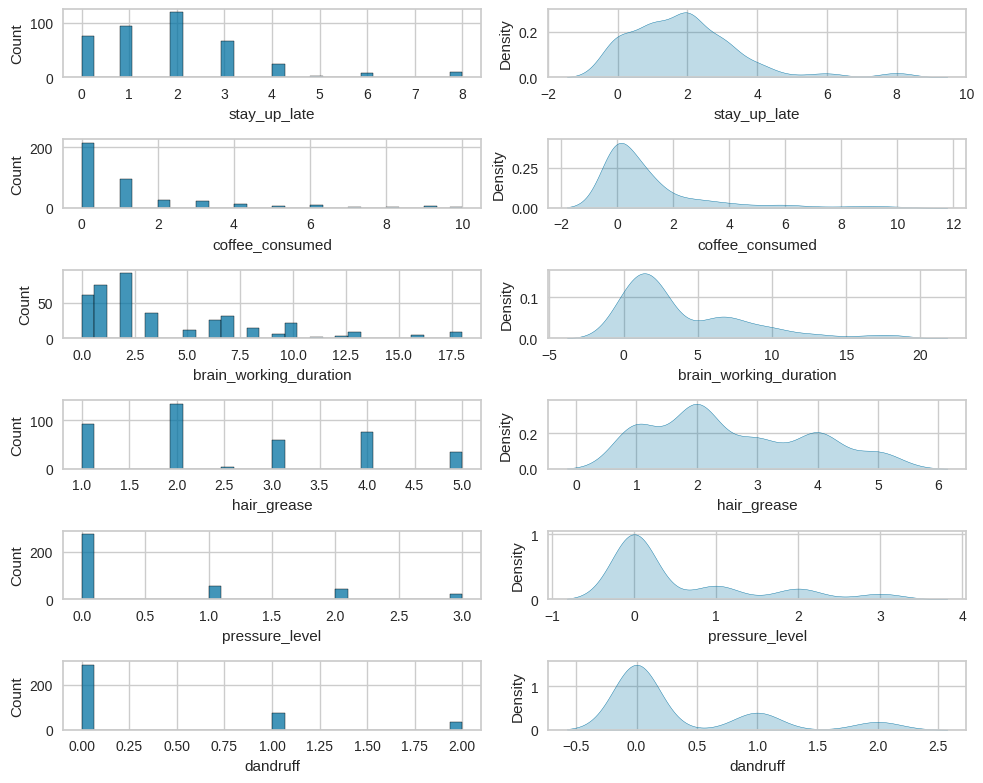

In [21]:
#What are the likely distributions of the numeric variables?

numeric_vars = ['stay_up_late', 'coffee_consumed', 'brain_working_duration', 'hair_grease', 'pressure_level', 'dandruff']

fig, axs = plt.subplots(len(numeric_vars), 2, figsize=(10, 8))

for i, var in enumerate(numeric_vars):
    sns.histplot(imputed_data[var], bins=30, edgecolor='black', ax=axs[i][0])
    sns.kdeplot(imputed_data[var], shade=True, ax=axs[i][1])

plt.tight_layout()
plt.show()

# **QQ Plots:-**
A QQ plot, short for quantile-quantile plot, is a graphical technique used to assess if a set of data points follows a certain distribution, such as a normal distribution

<Figure size 2000x800 with 0 Axes>

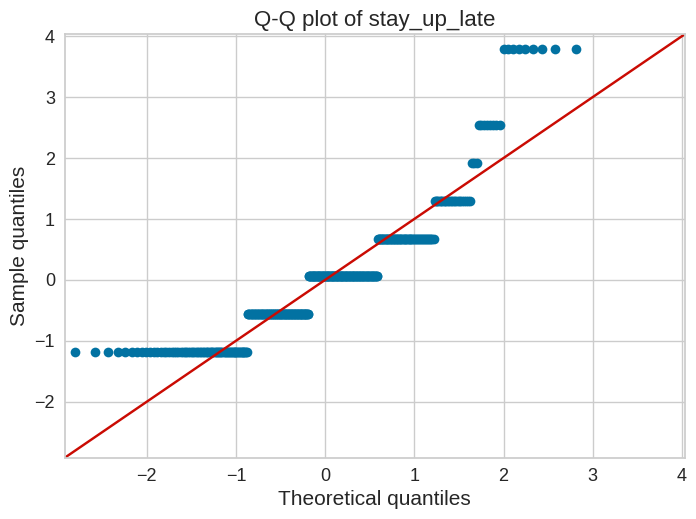

<Figure size 2000x800 with 0 Axes>

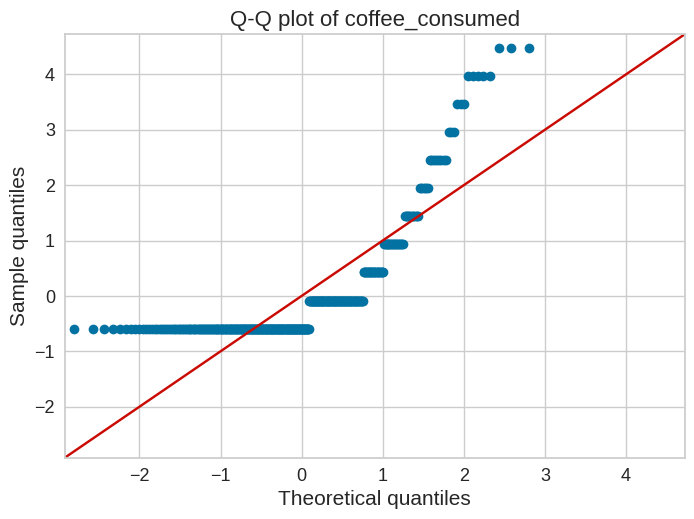

<Figure size 2000x800 with 0 Axes>

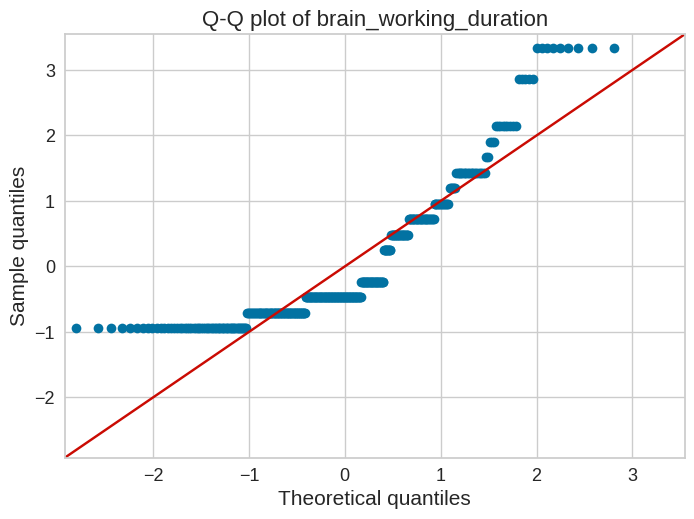

<Figure size 2000x800 with 0 Axes>

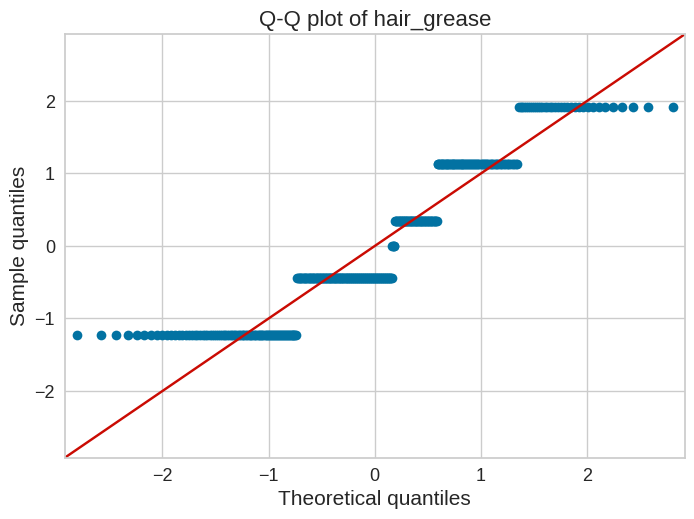

<Figure size 2000x800 with 0 Axes>

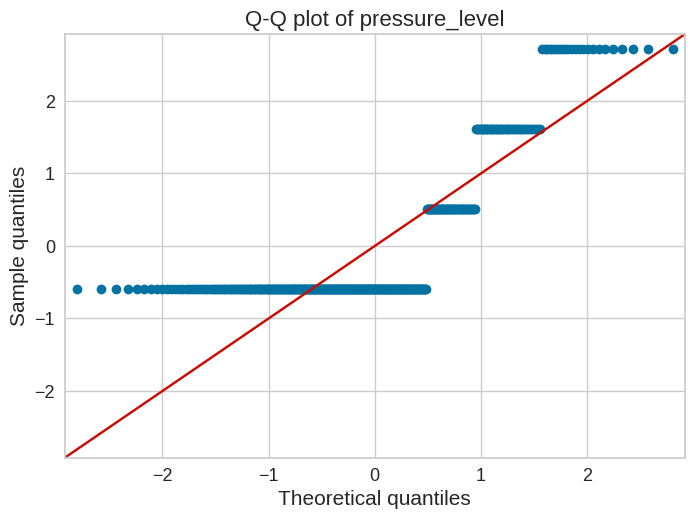

<Figure size 2000x800 with 0 Axes>

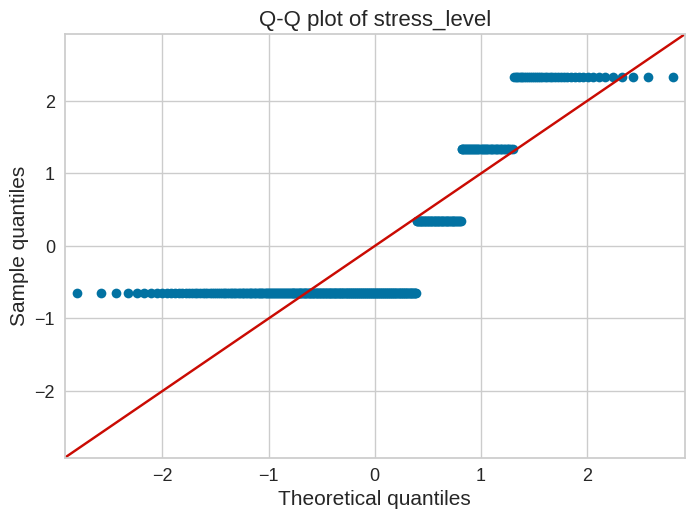

<Figure size 2000x800 with 0 Axes>

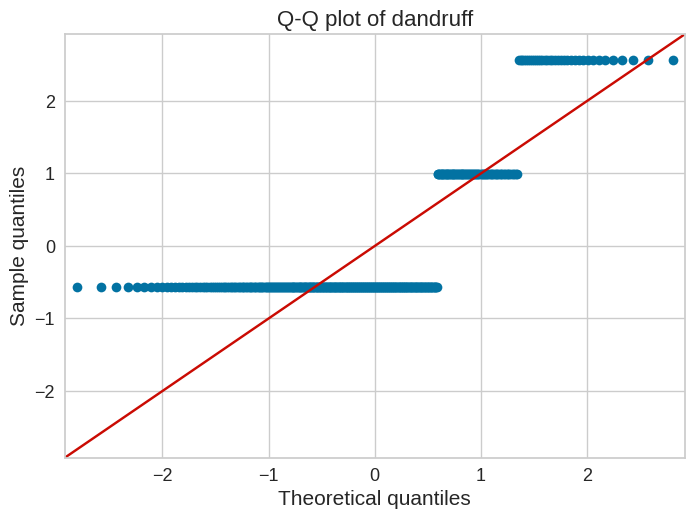

In [23]:
from statsmodels.graphics.gofplots import qqplot
independent_data=imputed_data[['stay_up_late','coffee_consumed', 'brain_working_duration', 'hair_grease','pressure_level','stress_level','dandruff' ]]
for c in independent_data.columns[:]:
  plt.figure(figsize=(20,8))
  fig=qqplot(independent_data[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

**Observation:**
1. Looking at the Q-Q plot above, it appears that some independent variables are roughly following normal distribution and has a lot of outliers present as the number of data is less.  
2.   There are many outliers in few of the predictor variables like in dandruff, stress level and coffee consumed etc.






# **Correlation Analysis**

In [24]:
imputed_data.corr()

,hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,stress_level,swimming,hair_grease,dandruff,libido
hair_loss,1.000000,0.349901,0.497609,0.518949,0.420956,0.524020,-0.103581,0.505263,0.523293,0.425367
stay_up_late,0.349901,1.000000,0.508844,0.718017,0.603039,0.352284,-0.127301,0.439185,0.477551,-0.061987
pressure_level,0.497609,0.508844,1.000000,0.826228,0.797197,0.889836,-0.269659,0.829852,0.919271,0.066658
coffee_consumed,0.518949,0.718017,0.826228,1.000000,0.847582,0.725233,-0.147065,0.680236,0.811721,0.036706
brain_working_duration,0.420956,0.603039,0.797197,0.847582,1.000000,0.726903,-0.228026,0.717837,0.809451,-0.083707
stress_level,0.524020,0.352284,0.889836,0.725233,0.726903,1.000000,-0.312828,0.747642,0.868707,0.045168
swimming,-0.103581,-0.127301,-0.269659,-0.147065,-0.228026,-0.312828,1.000000,-0.278167,-0.259308,0.087026
hair_grease,0.505263,0.439185,0.829852,0.680236,0.717837,0.747642,-0.278167,1.000000,0.863648,0.059235
dandruff,0.523293,0.477551,0.919271,0.811721,0.809451,0.868707,-0.259308,0.863648,1.000000,0.062513
libido,0.425367,-0.061987,0.066658,0.036706,-0.083707,0.045168,0.087026,0.059235,0.062513,1.000000


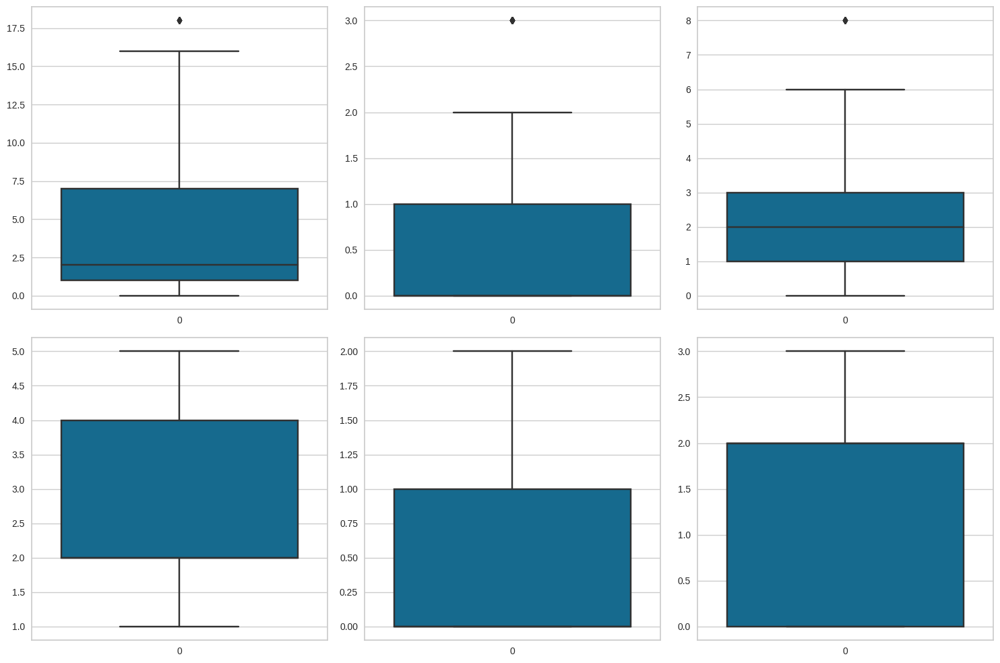

In [26]:
#Checking the Ranges of the predictor variables and dependent variable
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15,10))
sns.boxplot(imputed_data['brain_working_duration'], ax=axes[0,0])
sns.boxplot(imputed_data['pressure_level'], ax=axes[0,1])
sns.boxplot(imputed_data['stay_up_late'], ax=axes[0,2])
sns.boxplot(imputed_data['hair_grease'], ax=axes[1,0])
sns.boxplot(imputed_data['dandruff'], ax=axes[1,1])
sns.boxplot(imputed_data['hair_loss'], ax=axes[1,2])
plt.tight_layout()
plt.show()

**Observation:**<br>
It is clear to visualize and interpret the data. Looking at the boxplot above, we can infer below:
1. Brain Working Duration, Coffee Consumed,Pressure Level,Stay Up Late are having few outliers. Few people have greater Brain Working Duration, coffee consumption, different pressure level, staying up late.
2. Few independent variables are very close to zero like person having coffee, people having no pressure, people having no dandruff etc.
3. For other variables like Dandruff, Hair Grease, Stay Up Late, Brain Working duration it looks like most of the values lies in between of the respective ranges of the variables.

# **Correlation Analysis Using Heatmap**
Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

<Axes: >

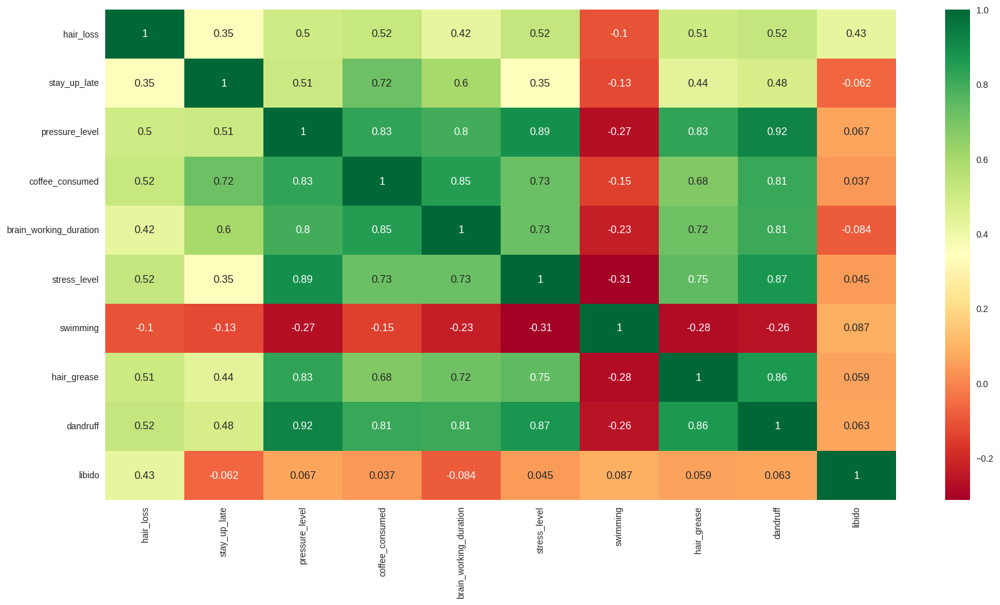

In [27]:
plt.figure(figsize=(20,10))
sns.heatmap(imputed_data.corr(), annot=True, cmap='RdYlGn', )

**Observation:**<br>
Correlation matrix and heatmap shows that there is multicollinearity between the independent variables. Highest correlation is between Pressure Level and Dandruff.

# **Correlation Analysis Using pairplot**

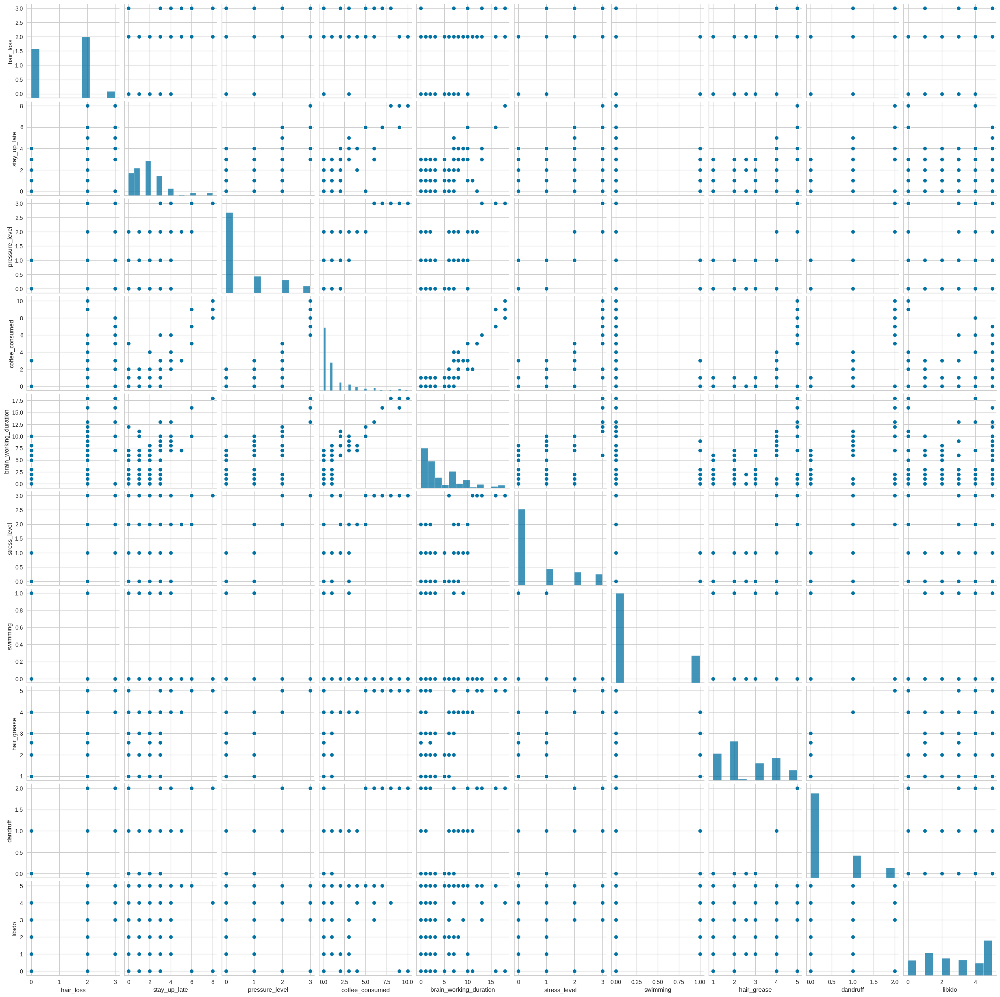

In [29]:
sns.pairplot(imputed_data) 

**Observation:**<br>
The variables are not independent of each other. There is multi - collinearity among lot of the independent variable which is shown by the correlation table and pairplot map


In [31]:
corr_matrix = imputed_data.corr()
corr_coefs = corr_matrix['hair_loss']                 #correlation against target variable
sorted_corr_coefs = corr_coefs.sort_values(ascending=False)
print(sorted_corr_coefs)

hair_loss                 1.000000
stress_level              0.524020
dandruff                  0.523293
coffee_consumed           0.518949
hair_grease               0.505263
pressure_level            0.497609
libido                    0.425367
brain_working_duration    0.420956
stay_up_late              0.349901
swimming                 -0.103581
Name: hair_loss, dtype: float64


**Observation:**
* Which predictor variables are the most important?<br>
Dandruff , Stress Level , Pressure Level , Hair Grease, Coffee Consumed are the top five independent variables that have strong correlation with Hair Loss
<br>
*   Predictor significance can be identified by the correlation analysis and also other two methods called variance importance and model selection

## **Feature Importance and Selection**
Lets fit a very simple linear model to understand how the habits of person are affecting its hair loss level


In [48]:
import statsmodels.api as sm

# Fit the linear regression model using OLS method
model = sm.OLS(imputed_data['hair_loss'], imputed_data[ 
       ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]).fit()

# Print out the summary statistics of the model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              hair_loss   R-squared (uncentered):                   0.787
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                              161.0
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                   1.34e-125
Time:                        03:33:10   Log-Likelihood:                         -447.80
No. Observations:                 400   AIC:                                      913.6
Df Residuals:                     391   BIC:                                      949.5
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
stress_level               0.4601      0.087      5.276      0.000       0.289       0.631
dandruff                   0.2065      0.173      1.193      0.234      -0.134       0.547
coffee_consumed            0.1741      0.050      3.468      0.001       0.075       0.273
hair_grease                0.1205      0.043      2.816      0.005       0.036       0.205
pressure_level            -0.4612      0.129     -3.582      0.000      -0.714      -0.208
libido                     0.2124      0.020     10.807      0.000       0.174       0.251
brain_working_duration    -0.0308      0.019     -1.646      0.101      -0.068       0.006
stay_up_late               0.0703      0.035      1.994      0.047       0.001       0.140
swimming                  -0.0278      0.093     -0.300      0.764      -0.210       0.154
==============================================================================
Omnibus:                       88.081   Durbin-Watson:                   1.512
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.943
Skew:                           0.198   Prob(JB):                     4.67e-05
Kurtosis:                       1.981   Cond. No.                         37.2
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# **Feature Selection:**
1. Feature selection is the process of identifying and selecting the most important features or attributes that are relevant and useful for a machine learning model. 
2. The goal of feature selection is to improve the accuracy and efficiency of the model by reducing the number of features, eliminating irrelevant or redundant features, and focusing on those that have the greatest impact on the output of the model. 
3. Feature selection is an important step in machine learning, as it can help to prevent overfitting, reduce noise in the data, and improve the interpretability and generalization of the model.





**Observation:**<br>
The p-values for each variable are as follows:

1. stress_level: 0.000
2. dandruff: 0.234
3. coffee_consumed: 0.001
4. hair_grease: 0.005
5. pressure_level: 0.000
6. libido: 0.000
7. brain_working_duration: 0.101
8. stay_up_late: 0.047
9. swimming: 0.764<br>
Based on these p-values, we can see that stress_level, coffee_consumed, hair_grease, pressure_level, libido, and stay_up_late are significant predictors of hair_loss, while dandruff and swimming are not significant. The p-value for brain_working_duration is close to 0.05, which indicates that it may or may not be a significant predictor, depending on the chosen level of significance.


In [35]:
X = imputed_data[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',                  'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]
y = imputed_data['hair_loss']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

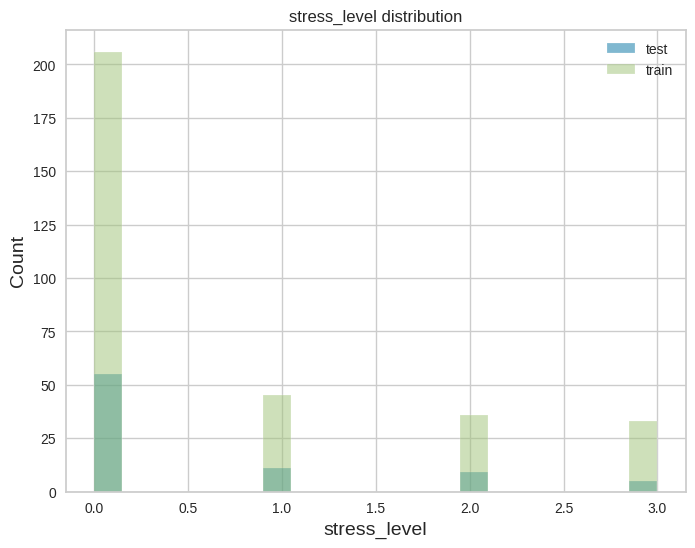

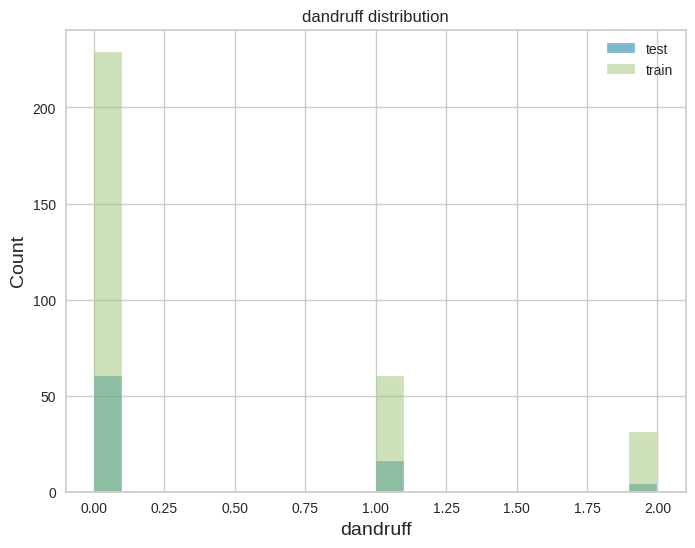

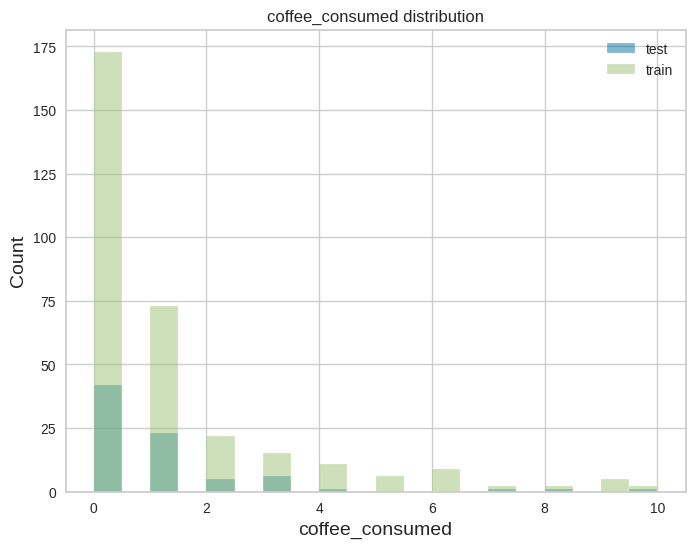

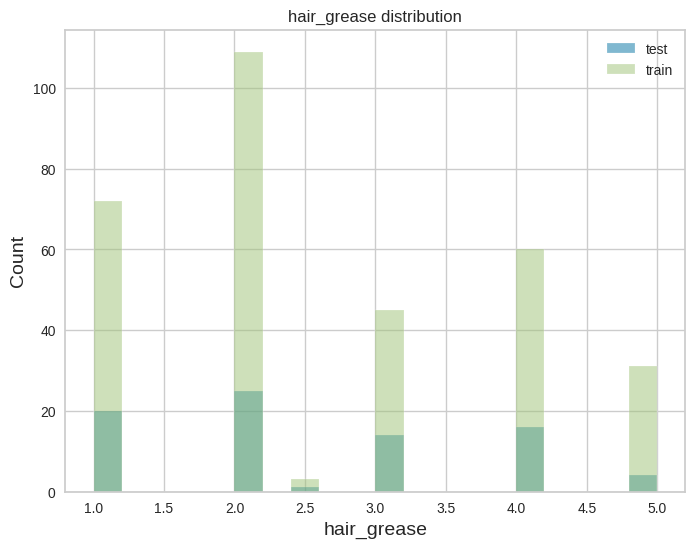

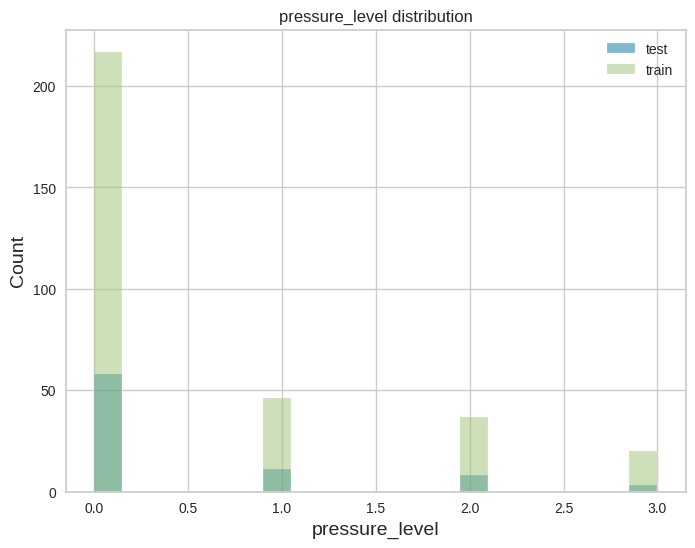

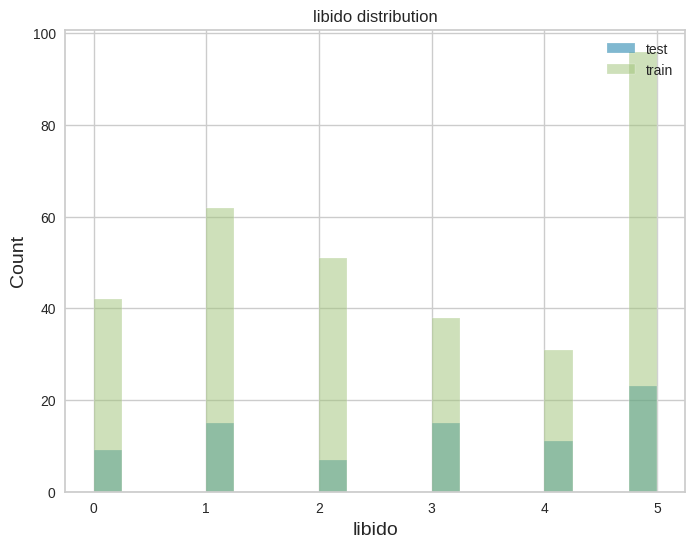

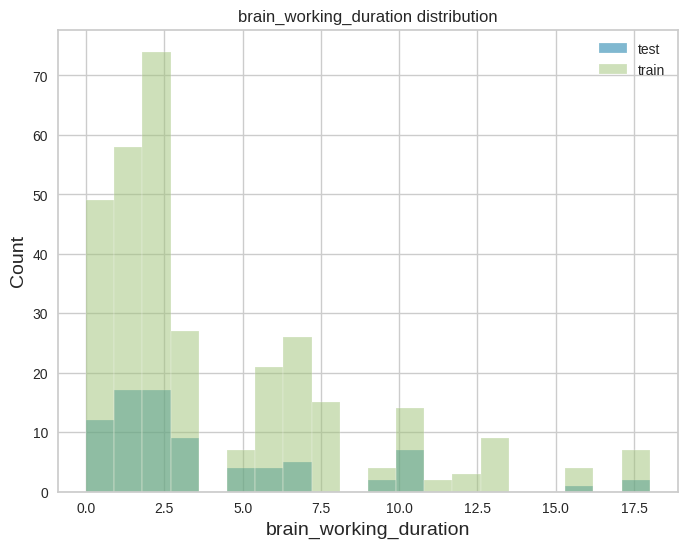

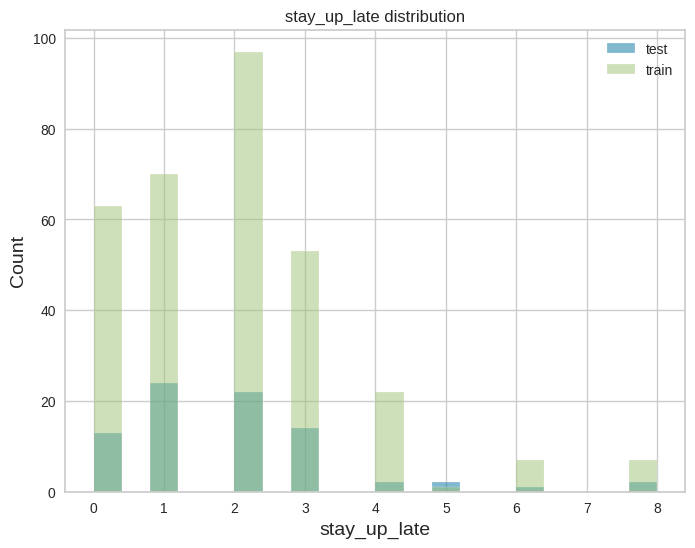

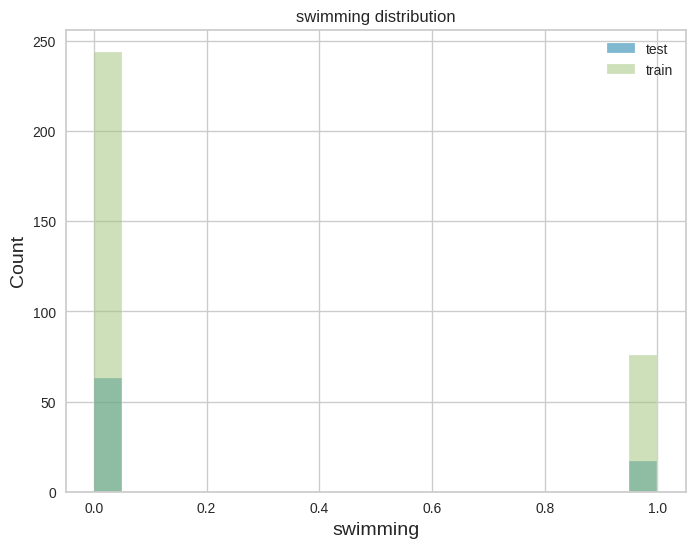

In [36]:
X_test_plot = X_test[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]

X_train_plot = X_train[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

**Observation:**
1.   Few Boundary Values in Staying up Late, Coffee Consumed, School assesment parameters which appears to be missing in testing data
2. No missing values in libido , dandruff, hair grease, hair washing etc.
3. Except from these all values are in testing and training data

## **How to handle missing data - Data Imputation techniques**
*   Adding missing values to the original dataframe by randomly selecting a percentage of rows and columns (1%, 5%, and 10%) and replacing the values in those rows and columns with NaN.
*   KNN Imputation
*   Simple Imputation
*   Iterative Imputation

We will remove 1%, 5% and 10% of the data from hair loss in our dataset and see how well imputation will recover the data back


In [38]:
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [39]:
# Remove 1% of data randomly

df_1 = imputed_data[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease']].sample(frac=0.99, random_state=1)
df_1.reset_index(drop=True, inplace=True)

# Remove 5% of data randomly
df_5 = imputed_data[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease']].sample(frac=0.95, random_state=5)
df_5.reset_index(drop=True, inplace=True)

# Remove 10% of data randomly
df_10 = imputed_data[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease']].sample(frac=0.9, random_state=10)
df_10.reset_index(drop=True, inplace=True)

In [40]:
# Create a function to perform imputation
def impute_df(df, imputer):
    X = df.copy()
    X_cols = X.columns
    X = X.values
    X = imputer.fit_transform(X)
    X = pd.DataFrame(X, columns=X_cols)
    return X

# Impute the values using SimpleImputer
simple_imputer = SimpleImputer(strategy='mean')
df_1_imp = impute_df(df_1, simple_imputer)
df_5_imp = impute_df(df_5, simple_imputer)
df_10_imp = impute_df(df_10, simple_imputer)

# Impute the values using KNNImputer
knn_imputer = KNNImputer(n_neighbors=5)
df_1_imp_knn = impute_df(df_1, knn_imputer)
df_5_imp_knn = impute_df(df_5, knn_imputer)
df_10_imp_knn = impute_df(df_10, knn_imputer)

# Impute the values using IterativeImputer
iter_imputer = IterativeImputer(max_iter=10, random_state=0)
df_1_imp_iter = impute_df(df_1, iter_imputer)
df_5_imp_iter = impute_df(df_5, iter_imputer)
df_10_imp_iter = impute_df(df_10, iter_imputer)

In [41]:
# Calculate the percentage error for each imputed dataframe
def calc_error(df_imp, df_orig):
    error = np.zeros_like(df_imp)

    for i in range(df_imp.shape[0]):
        for j in range(df_imp.shape[1]):
            if df_orig.iloc[i, j] != 0:
                error[i, j] = np.abs((df_imp.iloc[i, j] - df_orig.iloc[i, j]) / df_orig.iloc[i, j])
            else:
                error[i, j] = 0

    error_mean = error.mean().mean()
    return error_mean

error_1_simple = calc_error(df_1_imp, imputed_data)
error_5_simple = calc_error(df_5_imp, imputed_data)
error_10_simple = calc_error(df_10_imp, imputed_data)

error_1_knn = calc_error(df_1_imp_knn, imputed_data)
error_5_knn = calc_error(df_5_imp_knn, imputed_data)
error_10_knn = calc_error(df_10_imp_knn, imputed_data)

error_1_iter = calc_error(df_1_imp_iter, imputed_data)
error_5_iter = calc_error(df_5_imp_iter, imputed_data)
error_10_iter = calc_error(df_10_imp_iter, imputed_data)

cols_to_search = ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease']

df_imp = df_1_imp[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_1_simple = calc_error(df_imp, df_orig)

df_imp = df_5_imp[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_5_simple = calc_error(df_imp, df_orig)

df_imp = df_10_imp[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_10_simple = calc_error(df_imp, df_orig)

df_imp = df_1_imp_knn[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_1_knn = calc_error(df_imp, df_orig)

df_imp = df_5_imp_knn[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_5_knn = calc_error(df_imp, df_orig)

df_imp = df_10_imp_knn[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_10_knn = calc_error(df_imp, df_orig)

df_imp = df_1_imp_iter[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_1_iter = calc_error(df_imp, df_orig)

df_imp = df_5_imp_iter[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_5_iter = calc_error(df_imp, df_orig)

df_imp = df_10_imp_iter[cols_to_search]
df_orig = imputed_data[cols_to_search]
error_10_iter = calc_error(df_imp, df_orig)

print("Simple Imputer Error:")
print("Error for 1% data:", error_1_simple)
print("Error for 5% data:", error_5_simple)
print("Error for 10% data:", error_10_simple)

print("KNN Imputer Error:")
print("Error for 1% data:", error_1_knn)
print("Error for 5% data:", error_5_knn)
print("Error for 10% data:", error_10_knn)

print("Iterative Imputer Error:")
print("Error for 1% data:", error_1_iter)
print("Error for 5% data:", error_5_iter)
print("Error for 10% data:", error_10_iter)


Simple Imputer Error:
Error for 1% data: 0.477161620903046
Error for 5% data: 0.4528931312438616
Error for 10% data: 0.45557598157185325
KNN Imputer Error:
Error for 1% data: 0.477161620903046
Error for 5% data: 0.4528931312438616
Error for 10% data: 0.45557598157185325
Iterative Imputer Error:
Error for 1% data: 0.477161620903046
Error for 5% data: 0.4528931312438616
Error for 10% data: 0.45557598157185325


# **Interpreting the Imputation Methods**
1. Based on the 9 readings, it can be inferred that the effectiveness of imputation methods is influenced by the other features in the dataset. 
2. Additionally, it was observed that as the number of missing data points increases, the percentage error of residuals also increases. This suggests that datasets with fewer missing values are more likely to have more accurate imputations using the chosen method.

## **Why Imputing data is always better than deleting the row ?**
1. For obvious reason - Data Loss. When we delete a row we end up deleting a sample from training data which will do more harm to the model instead of doing any good.
2. Choosing an imputation method is not solely a personal preference, but should be based on the nature of the missing data and research objectives. Imputing missing data is a best practice to prevent bias and loss of statistical power, although it may not always improve model accuracy.



*   Based on the summaries, selecting only significant features (P value < 0.05) had little impact on the model outcome compared to using all features.
*   Both models predicted hair loss levels accurately, with the model using important features having a slightly better accuracy of 78.7% compared to 78.6% for the model using all features.
*   Given the results, it is recommended to use the data with important features and explore the use of different models.












In [49]:
X= imputed_data[ ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level','libido', 'brain_working_duration', 'stay_up_late', 'swimming']]
Y = imputed_data["hair_loss"]  # Target


In [55]:
!pip install shap
!pip install future
!pip install h2o
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=0499acff65361c405b133a5e4aeef415b15a06fffac912c60bbb300b37975e2d
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


## **How did you split the data into train, and test?**
The data was splitted into Training ad Testing Data into 90% and 10% respectively.

In [56]:
import sklearn
from sklearn.model_selection import train_test_split

import shap
import lime

# Splitting Data into Training and Test
( x_train, x_test, y_train, y_test,) = train_test_split(  X, Y, test_size=0.1, random_state=42 )

# Taking 100 samples out for SHAP analysis
x_train_100 = shap.utils.sample( x_train, 100 )   
# Taking 100 samples out for SHAP analysis
x_test_100 = shap.utils.sample( x_test, 100 )  

# **Fitting a Linear Model**

In [57]:
import sklearn
from sklearn.model_selection import train_test_split
# Initializing a Linear Model
linear_model = sklearn.linear_model.LinearRegression()  
# Training a linear model
linear_model.fit(x_train, y_train)  

LinearRegression()

In [58]:
# fit linear model
model = sm.OLS(imputed_data['hair_loss'], imputed_data[ ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]).fit()
       
# interpret coefficients
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:              hair_loss   R-squared (uncentered):                   0.787
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                              161.0
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                   1.34e-125
Time:                        04:01:06   Log-Likelihood:                         -447.80
No. Observations:                 400   AIC:                                      913.6
Df Residuals:                     391   BIC:                                      949.5
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

# **Interpreting Regression Co-efficients**
<br>

**Model Co-efficients**

The sign of a coefficient in a regression model indicates the direction of the relationship between the target and predictor variables. A positive coefficient indicates a positive correlation between the predictor and target variables, meaning that an increase in the predictor variable is associated with an increase in the target variable and vice versa. Conversely, a negative coefficient indicates a negative correlation between the predictor and target variables, meaning that an increase in the predictor variable is associated with a decrease in the target variable and vice versa.

<br>

**Table representation**<br>

The above table shows the coefficients for each variable in the linear regression model used to predict the level of hair loss. The highest coefficient value is for the variable "stress_level" with a value of 0.4601, followed by "libido" with a value of 0.2124. The absolute values of the coefficients provide an idea of the importance of variables in the linear regression model. Therefore, stress_level and libido are the most important variables in predicting the target variable, i.e. the level of hair loss.

The sign of the coefficient value indicates the direction of the relationship between the predictor and the target variable. A positive coefficient value means that an increase in the predictor variable leads to an increase in the target variable, and vice versa. A negative coefficient value means that an increase in the predictor variable leads to a decrease in the target variable, and vice versa.

Therefore, in this case, a higher level of stress_level and libido is associated with a higher level of hair loss.

<br>

**P-Values**<br>


If the p-value is 0.05 or lower, the result is significant, but if it is higher than 0.05, the result is non-significant

stress_level, coffee_consumed, hair_grease, pressure_level, libido, stay_up_late

These variables have P-Value less that 0.05, hence it can be interpreted that these variables are significant variables.





## **Fitting a Gradient Boosting(XG Boost) Model**

In [59]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# split data into training and testing sets
X= imputed_data[ ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level','libido', 'brain_working_duration', 'stay_up_late', 'swimming']]
y = imputed_data['hair_loss']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# define XGBoost model
xgb_model = xgb.XGBRegressor(objective="reg:squarederror", random_state=42)

# train the model
xgb_model.fit(X_train, y_train)

# make predictions on the testing set
y_pred = xgb_model.predict(X_test)

# calculate root mean squared error
rmse = mean_squared_error(y_test, y_pred, squared=False)

print("Root Mean Squared Error:", rmse)

Root Mean Squared Error: 0.15596091658084021


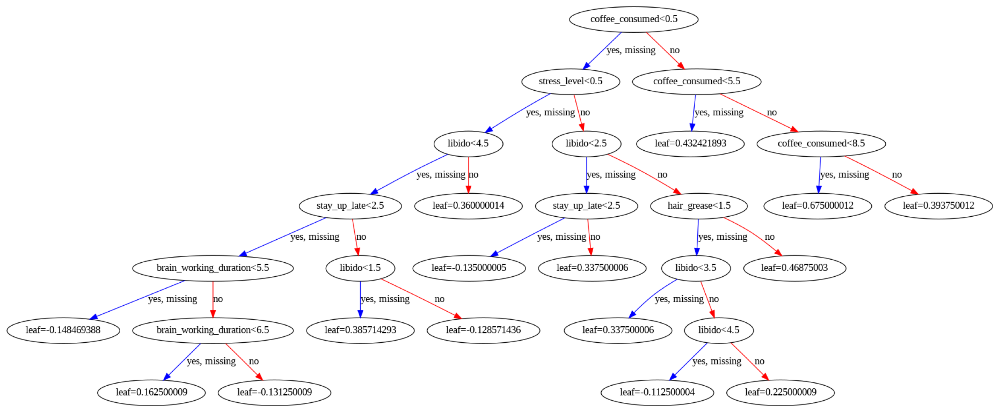

In [60]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(30, 25))
xgb.plot_tree(xgb_model, ax=ax, num_trees=0)
plt.show()

XGBoost regression model is built to predict hair loss based on features like stress level, dandruff, coffee consumption, hair grease, pressure level, libido, brain working duration, stay up late and swimming.
<br>
<br>
First, the dataset is split into training and testing sets using train_test_split from sklearn.model_selection module. Then, an XGBoost regression model is defined using xgb.XGBRegressor with the objective of minimizing the squared error. The model is trained on the training set using the fit method.
<br>
<br>
Next, the trained model is used to make predictions on the testing set using the predict method. The performance of the model is evaluated using root mean squared error (RMSE), which is calculated using mean_squared_error
<br>
<br>
To interpret the nodes of the tree-based XGBoost model, I used the SHAP values approach . SHAP values can be calculated for each feature using shap.TreeExplainer on the trained XGBoost model and then visualized using various SHAP plots. This can help to understand how each feature contributes to the final prediction made by the model.

In [61]:
# Get numerical feature importances
tree_importances = list(xgb_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(X_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [62]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: coffee_consumed      Importance: 0.5799999833106995
Variable: dandruff             Importance: 0.15000000596046448
Variable: stress_level         Importance: 0.09000000357627869
Variable: libido               Importance: 0.07000000029802322
Variable: stay_up_late         Importance: 0.05000000074505806
Variable: hair_grease          Importance: 0.029999999329447746
Variable: brain_working_duration Importance: 0.029999999329447746
Variable: pressure_level       Importance: 0.009999999776482582
Variable: swimming             Importance: 0.0


**Observation:**<br>
The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.


# **Using H2O AutoML to build best model** 

In [63]:
import logging
import h2o

# **Setting up maximum runtime for the AutoML**




In [64]:
min_mem_size = 6
run_time = 222

In [65]:
import psutil
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

5


In [66]:
import random, os, sys
port_no = random.randint(5555, 55555)
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:40618..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpalhihfqg
  JVM stdout: /tmp/tmpalhihfqg/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpalhihfqg/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:40618
Connecting to H2O server at http://127.0.0.1:40618 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,4 days
H2O_cluster_name:,H2O_from_python_unknownUser_86xxob
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# **Converting Pandas dataframe in H2O dataframe**

In [67]:
df = h2o.H2OFrame(imputed_data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [68]:
df.types

{'hair_loss': 'int',
 'stay_up_late': 'int',
 'pressure_level': 'int',
 'coffee_consumed': 'int',
 'brain_working_duration': 'int',
 'school_assesssment': 'enum',
 'stress_level': 'int',
 'shampoo_brand': 'enum',
 'swimming': 'int',
 'hair_washing': 'enum',
 'hair_grease': 'real',
 'dandruff': 'int',
 'libido': 'int',
 'predicted_disease_1': 'int'}

In [69]:
df.shape

(400, 14)

In [70]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [71]:
print(df_train.shape)
print(df_test.shape)

(315, 14)
(85, 14)


In [72]:
X=df.columns
print(X)

['hair_loss', 'stay_up_late', 'pressure_level', 'coffee_consumed', 'brain_working_duration', 'school_assesssment', 'stress_level', 'shampoo_brand', 'swimming', 'hair_washing', 'hair_grease', 'dandruff', 'libido', 'predicted_disease_1']


In [73]:
#Seperate Dependent variable from Independent variable
y_numeric ='hair_loss'
X.remove(y_numeric) 
print(X)

['stay_up_late', 'pressure_level', 'coffee_consumed', 'brain_working_duration', 'school_assesssment', 'stress_level', 'shampoo_brand', 'swimming', 'hair_washing', 'hair_grease', 'dandruff', 'libido', 'predicted_disease_1']


In [94]:
# Set up AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [95]:
#pass the data through H20AutoML
aml.train(x=X,y=y_numeric,training_frame=df_train) 

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),2/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


**Observation:**<br>
We can see above that the best model, is slighly overfitting on the dataset as there is a significant difference between the metrics on training and validation dataset



1. Mean Squared Error (MSE): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

2. Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

3. Mean Absolute Error (MAE): The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

4. Root Mean Squared Logarithmic Error (RMSLE): The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

5. Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

6. R-squared (R^2): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. A value of 1 means that the model explains all the variability in the data, while a value of 0 means that the model explains none of the variability.

7. K-fold cross-validation: It is used to validate a model internally, i.e., estimate the model performance without having to sacrifice a validation split.

8. Mean absolute percentage error: MAPE is the average absolute percentage difference between the labels and the predicted values. This metric ranges between zero and infinity; a lower value indicates a higher quality model.





In [96]:
print(aml.leaderboard)

model_id                                                    rmse        mse        mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_2_20230409_44559  0.269389  0.0725705  0.105672   0.135352                 0.0725705
GBM_grid_1_AutoML_2_20230409_44559_model_58             0.270867  0.073369   0.0994994  0.134876                 0.073369
GBM_grid_1_AutoML_2_20230409_44559_model_47             0.274813  0.0755223  0.102702   0.136044                 0.0755223
StackedEnsemble_BestOfFamily_3_AutoML_2_20230409_44559  0.2755    0.0759001  0.12621    0.139586                 0.0759001
GBM_5_AutoML_2_20230409_44559                           0.27591   0.0761262  0.117978   0.139807                 0.0761262
StackedEnsemble_AllModels_2_AutoML_2_20230409_44559     0.277304  0.0768977  0.127867   0.139943                 0.0768977
GBM_grid_1_AutoML_2_20230409_44559_model_87             0.277408  0.076955   0.0942944  0.135441                 0.076955
XGBoost_grid_1_Aut

The models in the leaderboard are ordered according to their RMSE scores, where a smaller score indicates better performance. The top row of the leaderboard shows the highest-performing model with the lowest RMSE score. By analyzing the evaluation metrics, different models can be compared and the most suitable model can be chosen for the specific use case.

<br>

In this leaderboard, the best performing model is


*   StackedEnsemble_BestOfFamily_4_AutoML_2_20230409_44559 with an rmse score of 0.269389.
*   The second-best model is GBM_grid_1_AutoML_2_20230409_44559_model_58 with an rmse score of 0.270867.






In [98]:
# Convert the H2O leaderboard to a pandas DataFrame
dff = aml.leaderboard.as_data_frame()
df_sorted1 = dff.sort_values(by='rmse')
# Print the top row of the sorted DataFrame
print(df_sorted1.head(1))

                                            model_id      rmse       mse  \
0  StackedEnsemble_BestOfFamily_4_AutoML_2_202304...  0.269389  0.072571   

        mae     rmsle  mean_residual_deviance  
0  0.105672  0.135352                0.072571  


# **Variance Inflation Factor (VIF)**

VIF, or Variance Inflation Factor, is a measure used to detect multicollinearity among a set of independent variables. 

<br>

Swimming is the least significant and dandruff,hair grease, and pressure level have high VIF which high collinearity




In [99]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF

multi_col_values = imputed_data[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = multi_col_values.columns
vif["VIF"] = [variance_inflation_factor(multi_col_values.values, i) for i in range(multi_col_values.shape[1])]
vif

,variables,VIF
0,stress_level,7.818234
1,dandruff,11.512201
2,coffee_consumed,9.430122
3,hair_grease,10.680688
4,pressure_level,13.097851
5,libido,3.047431
6,brain_working_duration,8.351337
7,stay_up_late,5.519876
8,swimming,1.420789


# **OLS:-**
Ordinary least squares (OLS) regression is a statistical method of analysis used for multivariate model that estimates the relationship between one or more independent variables and a dependent variable; the method estimates the relationship by minimizing the sum of the squares in the difference between the observed and predicted values of the dependent variable.

In [100]:
import statsmodels.api as sm

model = sm.OLS(imputed_data['hair_loss'], imputed_data[ ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late', 'swimming']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              hair_loss   R-squared (uncentered):                   0.787
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                              161.0
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                   1.34e-125
Time:                        04:59:03   Log-Likelihood:                         -447.80
No. Observations:                 400   AIC:                                      913.6
Df Residuals:                     391   BIC:                                      949.5
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
stress_level               0.4601      0.087      5.276      0.000       0.289       0.631
dandruff                   0.2065      0.173      1.193      0.234      -0.134       0.547
coffee_consumed            0.1741      0.050      3.468      0.001       0.075       0.273
hair_grease                0.1205      0.043      2.816      0.005       0.036       0.205
pressure_level            -0.4612      0.129     -3.582      0.000      -0.714      -0.208
libido                     0.2124      0.020     10.807      0.000       0.174       0.251
brain_working_duration    -0.0308      0.019     -1.646      0.101      -0.068       0.006
stay_up_late               0.0703      0.035      1.994      0.047       0.001       0.140
swimming                  -0.0278      0.093     -0.300      0.764      -0.210       0.154
==============================================================================
Omnibus:                       88.081   Durbin-Watson:                   1.512
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.943
Skew:                           0.198   Prob(JB):                     4.67e-05
Kurtosis:                       1.981   Cond. No.                         37.2
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

According to the OLS summary, the p-values for 'Swimming' and 'Dandruff' are above 0.05, which implies that these variables may not have a significant impact on hair loss prediction. However, 'Dandruff' is considered an important factor, and thus it cannot be dropped from the model. To obtain a model with all variables having p-values less than 0.05, the other independent variables can be dropped. The resulting model has an accuracy of 78.7%. The next step would be to evaluate the VIF and p-values for the remaining independent variables.



In [101]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF

multi_col_values = imputed_data[['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'stay_up_late' ]]

#we cannot remove dandruff as it is an important aspect for hair loss
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = multi_col_values.columns
vif["VIF"] = [variance_inflation_factor(multi_col_values.values, i) for i in range(multi_col_values.shape[1])]
vif

,variables,VIF
0,stress_level,7.618163
1,dandruff,11.339872
2,coffee_consumed,7.727030
3,hair_grease,8.710417
4,pressure_level,12.971235
5,libido,2.802938
6,stay_up_late,5.414506


VIF for all except three variables are less than 10. Dropping either of the two variables 'dandruff' or 'hair_grease', 'pressure_level	' wont make sense as they are important factors hair loss .

In [102]:
import statsmodels.api as sm

model = sm.OLS(imputed_data['hair_loss'], imputed_data[ ['stress_level', 'dandruff', 'coffee_consumed', 'hair_grease', 'pressure_level',
       'libido', 'brain_working_duration', 'stay_up_late']]).fit()
# Removing Swimming is not affecting accuracy
# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              hair_loss   R-squared (uncentered):                   0.787
Model:                            OLS   Adj. R-squared (uncentered):              0.783
Method:                 Least Squares   F-statistic:                              181.5
Date:                Sun, 09 Apr 2023   Prob (F-statistic):                   1.01e-126
Time:                        05:04:15   Log-Likelihood:                         -447.85
No. Observations:                 400   AIC:                                      911.7
Df Residuals:                     392   BIC:                                      943.6
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
stress_level               0.4631      0.086      5.354      0.000       0.293       0.633
dandruff                   0.2113      0.172      1.228      0.220      -0.127       0.550
coffee_consumed            0.1719      0.050      3.466      0.001       0.074       0.269
hair_grease                0.1182      0.042      2.812      0.005       0.036       0.201
pressure_level            -0.4579      0.128     -3.573      0.000      -0.710      -0.206
libido                     0.2111      0.019     11.021      0.000       0.173       0.249
brain_working_duration    -0.0308      0.019     -1.647      0.100      -0.068       0.006
stay_up_late               0.0708      0.035      2.013      0.045       0.002       0.140
==============================================================================
Omnibus:                       91.274   Durbin-Watson:                   1.509
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               20.276
Skew:                           0.202   Prob(JB):                     3.96e-05
Kurtosis:                       1.973   Cond. No.                         37.1
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

P-values for all the variables are less than 0.05 and the accuracy is 78.7%. It is unaffected even after removing Swimming tells us that these two variables were not important for calculating 'hair loss'.



# **H20 Re-Execution  on new model**

In [103]:
#Dropping the unecessary features
imputed_data1=imputed_data.drop(['swimming'], axis=1)
imputed_data1

,hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,school_assesssment,stress_level,shampoo_brand,hair_washing,hair_grease,dandruff,libido,predicted_disease_1
0,0,2,0,0,1,None,0,Pantene,Y,3.0,0,1,1.0
1,0,0,0,0,3,None,0,Pantene,N,1.0,0,1,0.0
2,2,3,0,1,0,None,0,Pantene,Y,2.0,0,2,1.0
3,0,2,0,0,1,None,0,Pantene,N,3.0,0,3,1.0
4,0,2,0,0,1,None,0,Pantene,Y,1.0,0,2,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,2,1,0,1,2,None,0,Hair & Shoulder,N,1.0,0,5,1.0
396,0,1,0,0,3,None,0,Hair & Shoulder,Y,2.0,0,1,0.0
397,2,1,0,1,1,None,0,Hair & Shoulder,N,2.0,0,5,2.0
398,2,0,0,1,1,None,0,Hair & Shoulder,N,2.0,0,5,1.0


In [104]:
#Calculating correlation matrix for all variables
imputed_data1.corr()

,hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,stress_level,hair_grease,dandruff,libido,predicted_disease_1
hair_loss,1.000000,0.349901,0.497609,0.518949,0.420956,0.524020,0.505263,0.523293,0.425367,0.637380
stay_up_late,0.349901,1.000000,0.508844,0.718017,0.603039,0.352284,0.439185,0.477551,-0.061987,0.469508
pressure_level,0.497609,0.508844,1.000000,0.826228,0.797197,0.889836,0.829852,0.919271,0.066658,0.643057
coffee_consumed,0.518949,0.718017,0.826228,1.000000,0.847582,0.725233,0.680236,0.811721,0.036706,0.681520
brain_working_duration,0.420956,0.603039,0.797197,0.847582,1.000000,0.726903,0.717837,0.809451,-0.083707,0.528926
stress_level,0.524020,0.352284,0.889836,0.725233,0.726903,1.000000,0.747642,0.868707,0.045168,0.678248
hair_grease,0.505263,0.439185,0.829852,0.680236,0.717837,0.747642,1.000000,0.863648,0.059235,0.654831
dandruff,0.523293,0.477551,0.919271,0.811721,0.809451,0.868707,0.863648,1.000000,0.062513,0.697314
libido,0.425367,-0.061987,0.066658,0.036706,-0.083707,0.045168,0.059235,0.062513,1.000000,0.491980
predicted_disease_1,0.637380,0.469508,0.643057,0.681520,0.528926,0.678248,0.654831,0.697314,0.491980,1.000000


Text(0.5, 1.0, 'Feature Correlation')

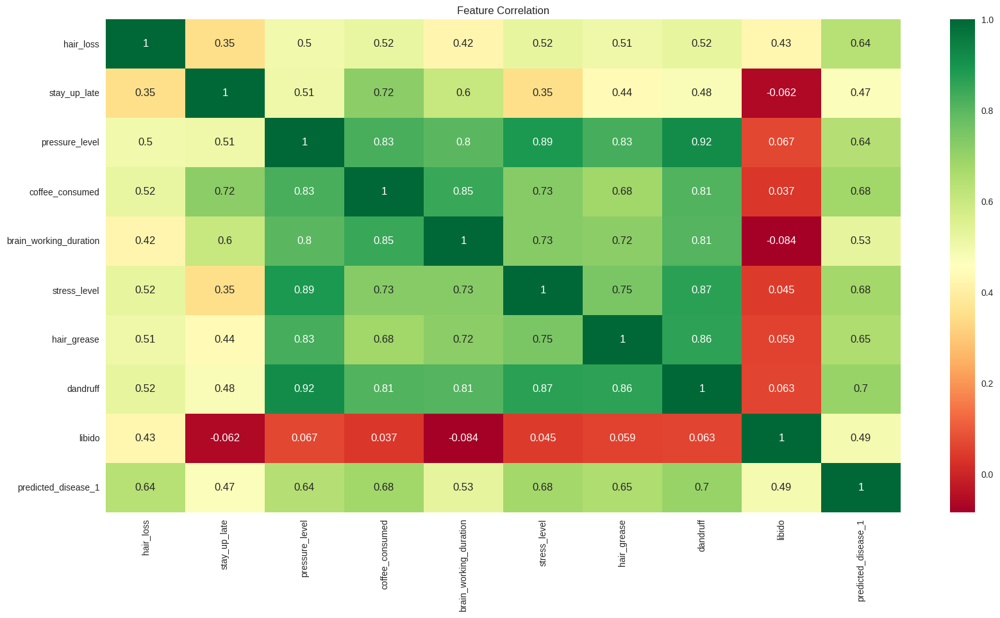

In [105]:
plt.figure(figsize=(20,10))
sns.heatmap(imputed_data1.corr(), annot=True, cmap='RdYlGn')
plt.title('Feature Correlation')

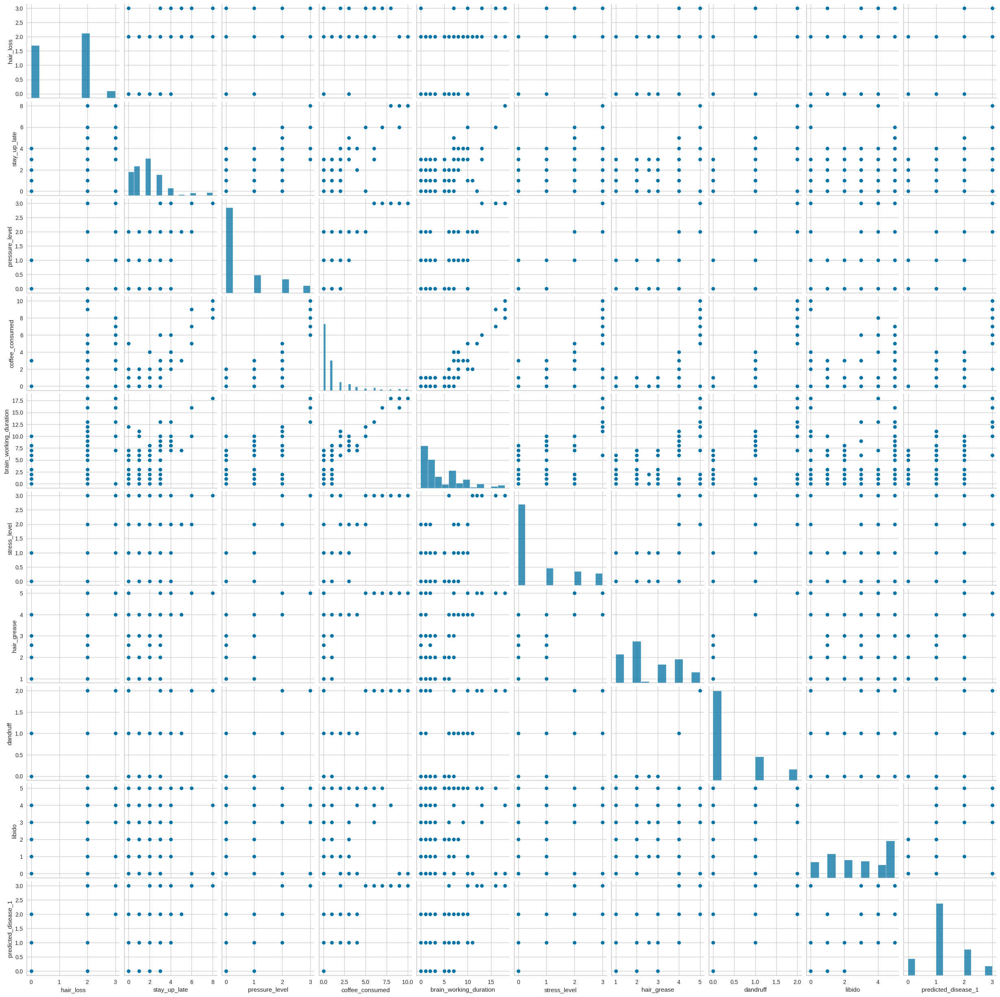

In [106]:
sns.pairplot(imputed_data1)


In [107]:
df1 = h2o.H2OFrame(imputed_data)  # Converted Pandas Dataframe to H2O dataframe to proceed with AutoML
df1=df1.drop(['swimming','school_assesssment','shampoo_brand','hair_washing'])
df1

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


hair_loss,stay_up_late,pressure_level,coffee_consumed,brain_working_duration,stress_level,hair_grease,dandruff,libido,predicted_disease_1
0,2,0,0,1,0,3,0,1,1
0,0,0,0,3,0,1,0,1,0
2,3,0,1,0,0,2,0,2,1
0,2,0,0,1,0,3,0,3,1
0,2,0,0,1,0,1,0,2,1
0,0,0,0,3,0,1,0,3,1
2,3,0,1,1,0,2,0,3,1
0,0,0,0,1,0,3,0,3,1
0,2,0,0,2,0,2,0,4,1
2,1,0,1,2,0,1,0,5,1


In [108]:
df1_train, df1_test = df1.split_frame([pct_rows])

In [110]:
X1=df1.columns
print(X1)

['hair_loss', 'stay_up_late', 'pressure_level', 'coffee_consumed', 'brain_working_duration', 'stress_level', 'hair_grease', 'dandruff', 'libido', 'predicted_disease_1']


In [111]:
#Seperate Dependent variable from Independent variable
y1_numeric ='hair_loss'
X1.remove(y1_numeric) 
print(X1)

['stay_up_late', 'pressure_level', 'coffee_consumed', 'brain_working_duration', 'stress_level', 'hair_grease', 'dandruff', 'libido', 'predicted_disease_1']


In [112]:
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [113]:
aml1.train(x=X1,y=y1_numeric,training_frame=df1_train) 

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_5_AutoML_3_20230409_51128


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    59                 59                          30256                  6            6            6             22            53            36.1017

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.03128523796547512
RMSE: 0.17687633523305235
MAE: 0.06327328774634572
RMSLE: 0.0885245304486489
Mean Residual Deviance: 0.03128523796547512

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.1108960102705951
RMSE: 0.3330105257654705
MAE: 0.14368543093538688
RMSLE: 0.16398445594150174
Mean Residual Deviance: 0.1108960102705951

Cross-Validation Metrics Summary: 
                        mean      sd         cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  ---------  ------------  ------------  ------------  ------------  ------------
mae                     0.144492  0.0332184  0.119219      0.180768      0.106026      0.175579      0.140869
mean_residual_deviance  0.113548  0.0344459  0.103517      0.147421      0.0630822     0.144135      0.109583
mse                     0.113548  0.0344459  0.103517      0.147421      0.0630822     0.144135      0.109583
r2                      0.898824  0.0317047  0.909102      0.868099      0.944361      0.869211      0.903348
residual_deviance       0.113548  0.0344459  0.103517      0.147421      0.0630822     0.144135      0.109583
rmse                    0.333508  0.0538505  0.32174       0.383954      0.251162      0.379652      0.331033
rmsle                   0.163686  0.0360869  0.177052      0.208773      0.132481      0.121316      0.178806

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-09 05:11:42  0.441 sec   0                  1.07377          1.03829         1.15298
    2023-04-09 05:11:42  0.450 sec   5                  0.686045         0.654943        0.470657
    2023-04-09 05:11:42  0.457 sec   10                 0.464305         0.421642        0.215579
    2023-04-09 05:11:42  0.464 sec   15                 0.345072         0.287286        0.119075
    2023-04-09 05:11:42  0.471 sec   20                 0.278676         0.205621        0.0776603
    2023-04-09 05:11:42  0.478 sec   25                 0.243835         0.151558        0.0594554
    2023-04-09 05:11:42  0.486 sec   30                 0.22024          0.117858        0.0485055
    2023-04-09 05:11:42  0.494 sec   35                 0.204396         0.0948706       0.0417776
    2023-04-09 05:11:42  0.501 sec   40                 0.196679         0.08198         0.0386824
    2023-04-09 05:11:42  0.508 sec   45                 0.189355         0.0751284       0.0358553
    2023-04-09 05:11:42  0.519 sec   50                 0.181426         0.0687717       0.0329153
    2023-04-09 05:11:42  0.526 sec   55                 0.17724          0.0645115       0.0314142
    2023-04-09 05:11:42  0.531 sec   59                 0.176876         0.0632733       0.0312852

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
coffee_consumed         812.115                1                    0.472191
libido                  279.791                0.344521             0.16268
predicted_disease_1     187.296                0.230627             0.1089
stay_up_late  

In [114]:
print(aml1.leaderboard)

model_id                                                    rmse       mse       mae     rmsle    mean_residual_deviance
GBM_5_AutoML_3_20230409_51128                           0.333011  0.110896  0.143685  0.163984                  0.110896
StackedEnsemble_AllModels_2_AutoML_3_20230409_51128     0.334987  0.112217  0.154283  0.16479                   0.112217
GBM_grid_1_AutoML_3_20230409_51128_model_120            0.335463  0.112535  0.117705  0.157087                  0.112535
StackedEnsemble_BestOfFamily_3_AutoML_3_20230409_51128  0.336289  0.11309   0.152357  0.165246                  0.11309
StackedEnsemble_BestOfFamily_4_AutoML_3_20230409_51128  0.336832  0.113456  0.156634  0.165877                  0.113456
StackedEnsemble_BestOfFamily_5_AutoML_3_20230409_51128  0.3412    0.116418  0.13979   0.167973                  0.116418
GBM_grid_1_AutoML_3_20230409_51128_model_181            0.346847  0.120303  0.13437   0.166063                  0.120303
GBM_grid_1_AutoML_3_20230409_5112

In [115]:
#Assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml1_leaderboard_df1=aml1.leaderboard.as_data_frame()
models_dict={}
for m in aml1_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml1_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict
     

{'GBM_5_AutoML_3_20230409_51128': 0, 'GLM_1_AutoML_3_20230409_51128': 261}

In [116]:
#print the index value of best model
print(model_index)
best_model = h2o.get_model(aml1.leaderboard[model_index,'model_id'])
     

0


In [117]:
best_model.algo

'gbm'

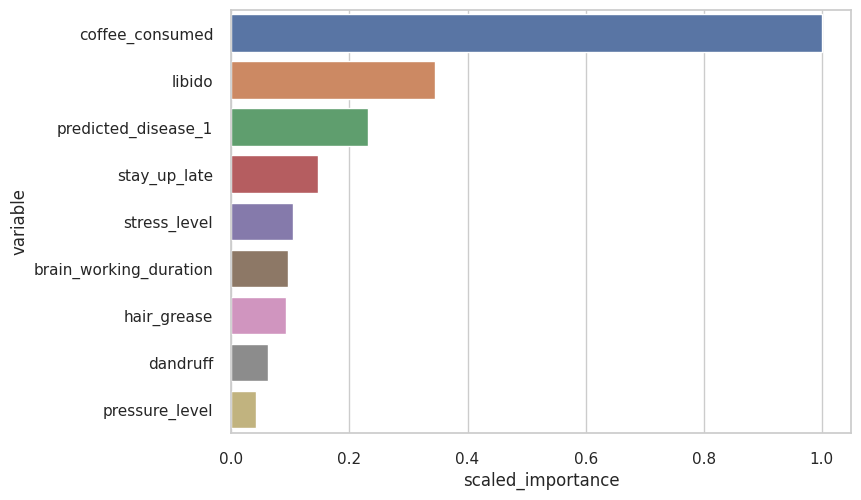

In [118]:
#plot variables in order of their importance for price prediction
variable_importances = best_model.varimp(use_pandas=True)

# Plot variable importances using seaborn library
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")
sns.barplot(x="scaled_importance", y="variable", data=variable_importances)
plt.show()

261
glm


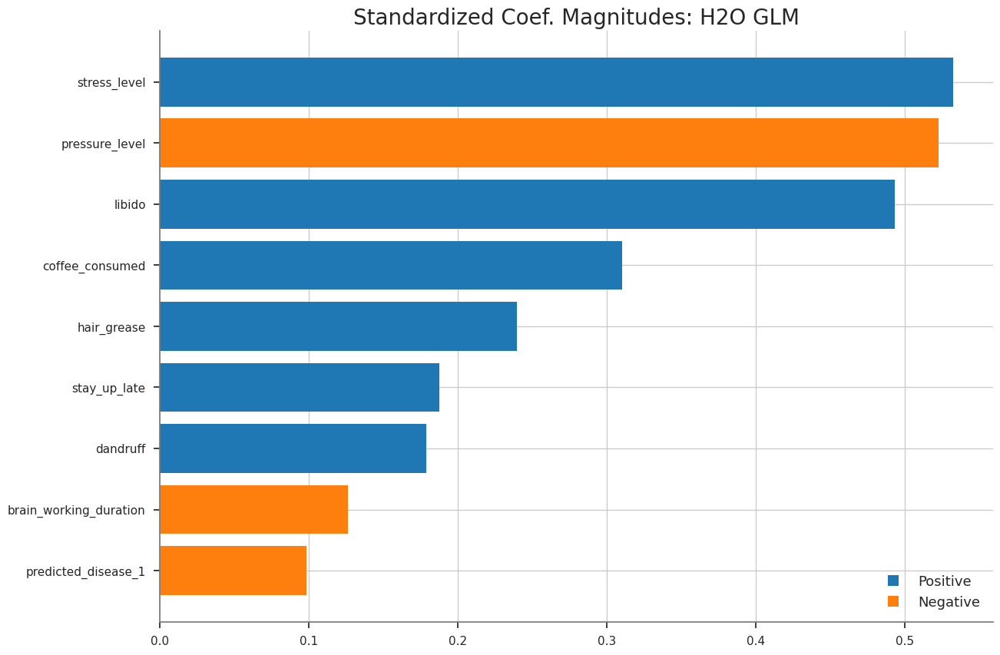

In [119]:
if glm_index is not 0:
  print(glm_index)
  glm_model1=h2o.get_model(aml1.leaderboard[glm_index,'model_id'])
  print(glm_model1.algo) 
  glm_model1.std_coef_plot()

From the above results, we observe that Stress Level, Libido, Coffee

Consumed, Pressure Level, Hair Grease are 
some of the important features.



In [121]:
#Seperating the predictor and target variables
A=imputed_data1.drop(['hair_loss'],axis=1)
B=imputed_data1['hair_loss']

In [122]:
#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

In [123]:
cols1 = [ 'stay_up_late', 'pressure_level', 'coffee_consumed', 'stress_level', 'hair_grease', 'dandruff', 'libido']
model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

In [124]:
b_pred = model1.predict(sm.add_constant(A_train[cols1]))
residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 1.9151347174783951e-16


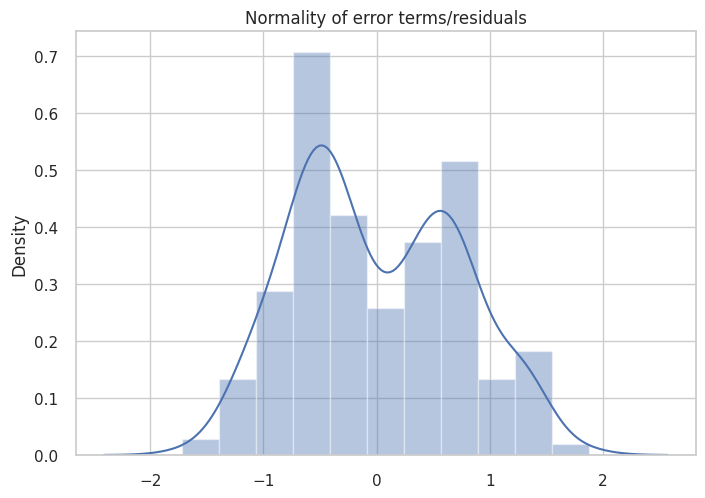

In [125]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

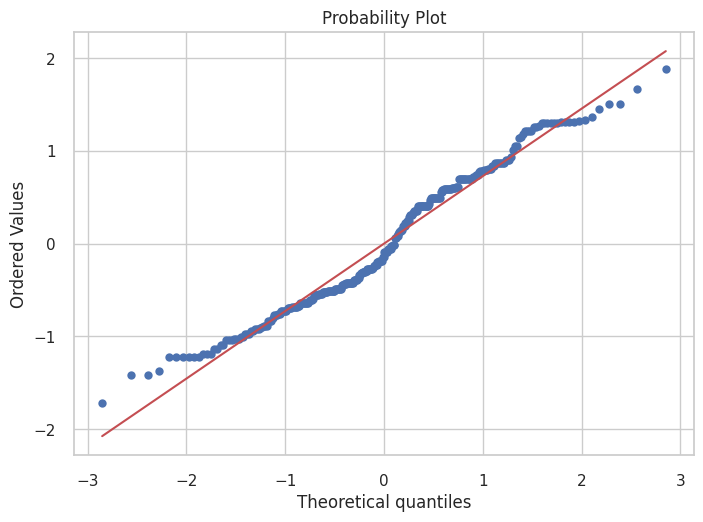

In [126]:
import pylab 
import scipy.stats as stats   
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='hair_loss', ylabel='Count'>

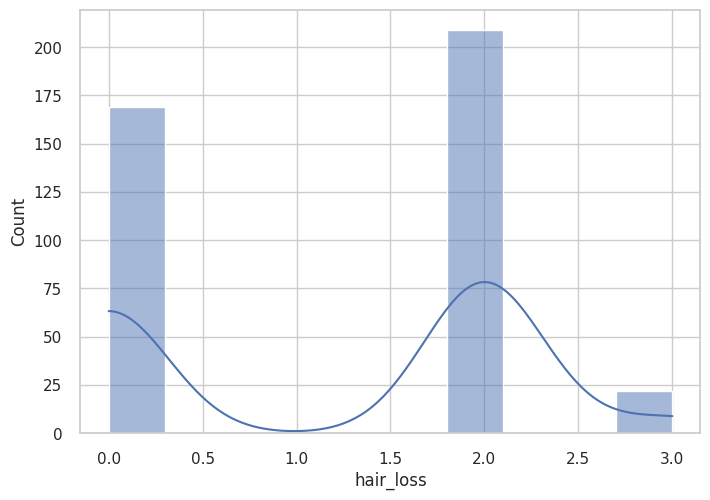

In [127]:
sns.histplot(imputed_data.hair_loss, kde = True)


**Ideally for the scatterplot the result should be scattered and it should not 
have any particular pattern.When the same is plotted as distplot it should follow a bell curve pattern.Both the plots give the expected result so even this assumptions are satisfied.**



# **Regularization in H20**
We use H2OGeneralizedLinearEstimator which would enable us to fit a generalized linear model, specified by a response variable, a set of predictors and a description of the error distribution.



In [128]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
hair_glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = 0, compute_p_values = True)
hair_glm_regularization_ridge = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = .001, alpha = 0)
hair_glm_regularization_lasso = H2OGeneralizedLinearEstimator(family='gaussian', lambda_=0.001, alpha=1.0)
hair_glm_regularization_elasticnet = H2OGeneralizedLinearEstimator(family="gaussian", alpha=0.5, lambda_=0.01)

In [129]:
#Model details without regularization
hair_glm.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681013372411_78


GLM Model: summary
    family    link      regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  None              9                             9                              1                       py_17_sid_8799

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.5332845092612746
RMSE: 0.7302633150181341
MAE: 0.6303010550644204
RMSLE: 0.39726104192977035
Mean Residual Deviance: 0.5332845092612746
R^2: 0.5374711073786759
Null degrees of freedom: 314
Residual degrees of freedom: 305
Null deviance: 363.1873015873009
Residual deviance: 167.9846204173015
AIC: 717.890710163325

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse       training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ------------------  -------------------  ------------------  ------------------
    2023-04-09 05:30:51  0.000 sec   0             363.1873015873009          1.1529755605946062
    2023-04-09 05:30:51  0.032 sec   1                                                            0.7302633150181341  0.5332845092612746   0.6303010550644204  0.5374711073786759

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
pressure_level          0.591395               1                    0.199433
stress_level            0.580986               0.982399             0.195923
libido                  0.512945               0.867348             0.172978
coffee_consumed         0.340193               0.575238             0.114722
hair_grease             0.262516               0.443892             0.0885268
stay_up_late            0.199267               0.336944             0.0671979
dandruff                0.19372                0.327564             0.0653272
brain_working_duration  0.145382               0.245829             0.0490264
predicted_disease_1     0.138976               0.234997             0.0468662

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# **Ridge Regularization**



*   Ridge regularization is a technique used in machine learning to reduce the impact of multicollinearity (high correlation) among predictor variables in a linear regression model. 
*   It works by adding a penalty term to the ordinary least squares (OLS) cost function that is proportional to the sum of the squared values of the model's coefficients. The penalty term shrinks the coefficients towards zero, reducing the impact of multicollinearity and preventing overfitting.
*   Ridge regularization is particularly useful when dealing with high-dimensional data or when the number of features is greater than the number of observations. It is a form of L2 regularization, which is one of the most common regularization techniques used in machine learning.








In [130]:
hair_glm_regularization_ridge.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681013372411_79


GLM Model: summary
    family    link      regularization            number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Ridge ( lambda = 0.001 )  9                             9                              1                       py_17_sid_8799

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.5333078517022528
RMSE: 0.7302792970516505
MAE: 0.6309032022048102
RMSLE: 0.39745044045229516
Mean Residual Deviance: 0.5333078517022528
R^2: 0.5374508619877274
Null degrees of freedom: 314
Residual degrees of freedom: 305
Null deviance: 363.1873015873009
Residual deviance: 167.99197328620963
AIC: 717.9044977529954

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse       training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ------------------  -------------------  ------------------  ------------------
    2023-04-09 05:31:36  0.000 sec   0             363.1873015873009          1.1529755605946062
    2023-04-09 05:31:36  0.015 sec   1                                                            0.7302792970516505  0.5333078517022528   0.6309032022048102  0.5374508619877274

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
pressure_level          0.576293               1                    0.19839
stress_level            0.570335               0.989661             0.196339
libido                  0.508589               0.882517             0.175083
coffee_consumed         0.333623               0.578912             0.114851
hair_grease             0.257436               0.44671              0.088623
stay_up_late            0.196791               0.341478             0.0677459
dandruff                0.190495               0.330552             0.0655784
brain_working_duration  0.141228               0.245063             0.0486181
predicted_disease_1     0.130054               0.225673             0.0447715

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# **Lasso Regularization**



*   Lasso (Least Absolute Shrinkage and Selection Operator) regularization is a technique used in machine learning to address overfitting and feature selection in linear regression models. 
*   It works by adding a penalty term to the OLS cost function that is proportional to the sum of the absolute values of the model's coefficients. This penalty term forces some of the coefficients to be zero, effectively selecting a subset of the most important features and eliminating the less important ones.



In [131]:
hair_glm_regularization_lasso.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681013372411_80


GLM Model: summary
    family    link      regularization           number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  -----------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Lasso (lambda = 0.001 )  9                             9                              1                       py_17_sid_8799

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.5334707946931797
RMSE: 0.7303908506362738
MAE: 0.6318575480561109
RMSLE: 0.39777783485731544
Mean Residual Deviance: 0.5334707946931797
R^2: 0.5373095380980495
Null degrees of freedom: 314
Residual degrees of freedom: 305
Null deviance: 363.1873015873009
Residual deviance: 168.04330032835162
AIC: 718.000725855638

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse       training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ------------------  -------------------  ------------------  ------------------
    2023-04-09 05:32:11  0.000 sec   0             363.1873015873009          1.1529755605946062
    2023-04-09 05:32:11  0.008 sec   1                                                            0.7303908506362738  0.5334707946931797   0.6318575480561109  0.5373095380980495

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
stress_level            0.554447               1                    0.198798
pressure_level          0.552168               0.995891             0.197981
libido                  0.500737               0.903129             0.17954
coffee_consumed         0.320495               0.578044             0.114914
hair_grease             0.248278               0.447795             0.0890208
stay_up_late            0.191519               0.345424             0.0686696
dandruff                0.180411               0.32539              0.0646868
brain_working_duration  0.129266               0.233145             0.0463488
predicted_disease_1     0.111672               0.201412             0.0400404

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# **Elastic Net Regularization**

*   Elastic Net regularization is a technique used in machine learning to address overfitting and multicollinearity in linear regression models. It combines the strengths of both Lasso and Ridge regularization by adding a penalty term that is a linear combination of the L1 (absolute) and L2 (squared) norms of the model's coefficients.

*   Elastic Net regularization works by shrinking the coefficients towards zero and forcing some of them to be exactly zero, thereby achieving feature selection. It is particularly useful when dealing with high-dimensional data or when there are many features that are potentially irrelevant or redundant, as it can help to identify the most important features while also reducing the impact of multicollinearity.



In [132]:
hair_glm_regularization_elasticnet.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681013372411_81


GLM Model: summary
    family    link      regularization                             number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  -----------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.01 )  9                             8                              1                       py_17_sid_8799

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.5387723116641892
RMSE: 0.7340111114037642
MAE: 0.6396853993106555
RMSLE: 0.4017361720390326
Mean Residual Deviance: 0.5387723116641892
R^2: 0.5327114207118706
Null degrees of freedom: 314
Residual degrees of freedom: 306
Null deviance: 363.1873015873009
Residual deviance: 169.7132781742196
AIC: 719.1156751510849

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse       training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  ------------------  -------------------  ------------------  ------------------
    2023-04-09 05:32:56  0.000 sec   0             363.1873015873009          1.1529755605946062
    2023-04-09 05:32:56  0.003 sec   1                                                            0.7340111114037642  0.5387723116641892   0.6396853993106555  0.5327114207118706

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
libido                  0.448582               1                    0.222868
stress_level            0.432279               0.963657             0.214768
pressure_level          0.369127               0.822874             0.183392
coffee_consumed         0.234384               0.522499             0.116448
hair_grease             0.185177               0.412805             0.0920009
stay_up_late            0.157775               0.351719             0.0783867
dandruff                0.124483               0.277504             0.0618467
brain_working_duration  0.0609659              0.135908             0.0302895
predicted_disease_1     0                      0                    0

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

## **Which models did you explore and did you try to tune the hyperparameters of the best model you got?**
I trained multiple models for this purpose including the simplest Linear Regression to using AutoML to get the best model it could fit. The models I trained for this purpose were

1. Linear Regressor
2. XG Boost Regressor
3. AutoML

# **SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

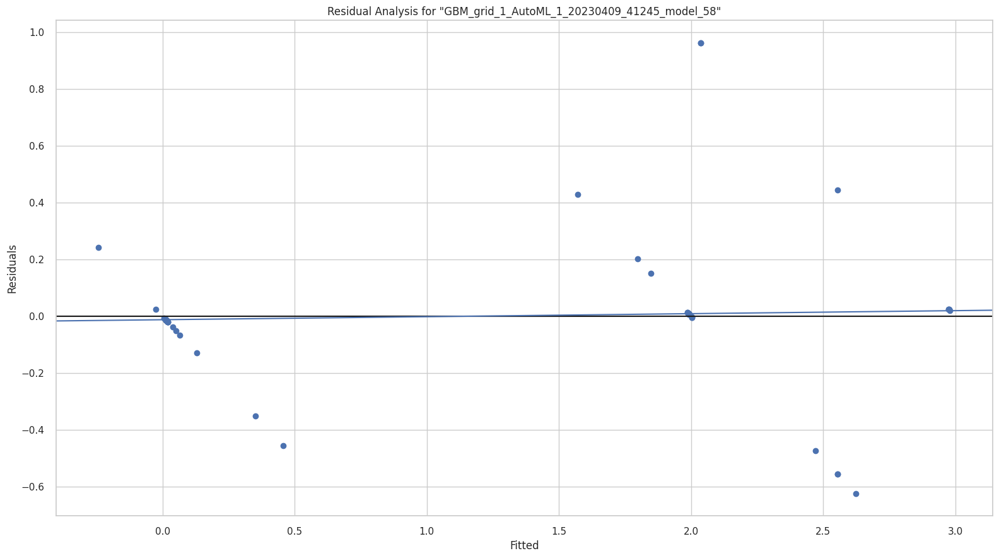

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

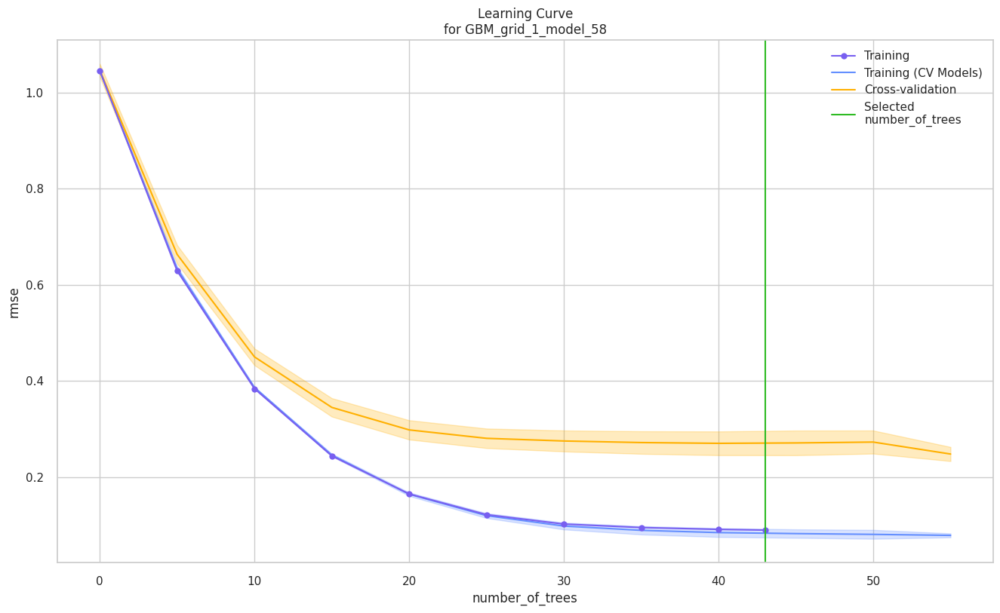

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

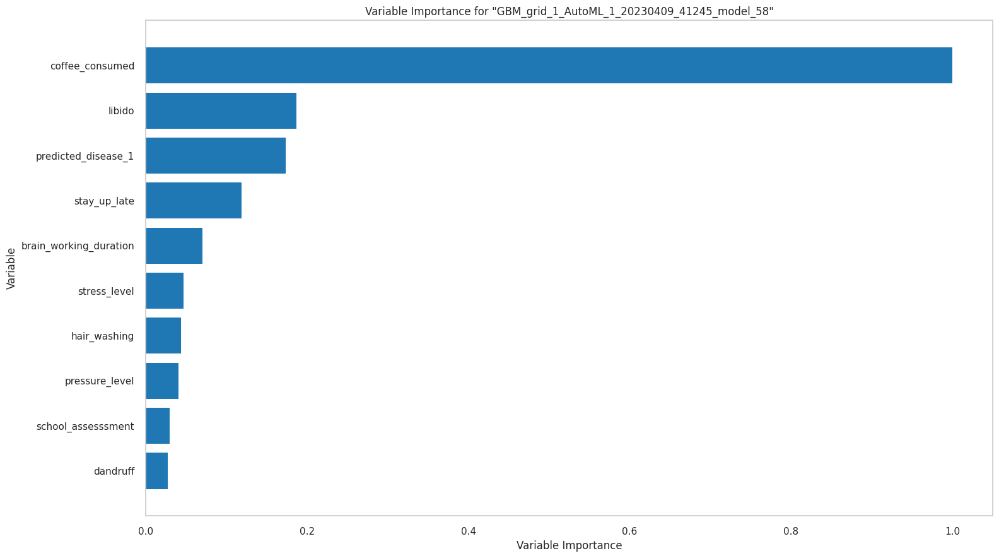

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

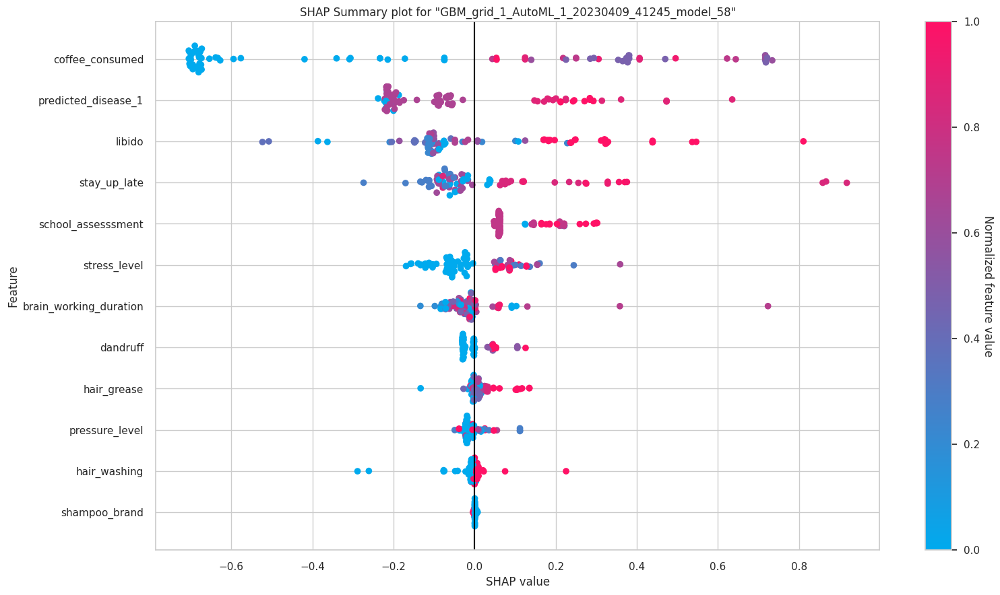

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

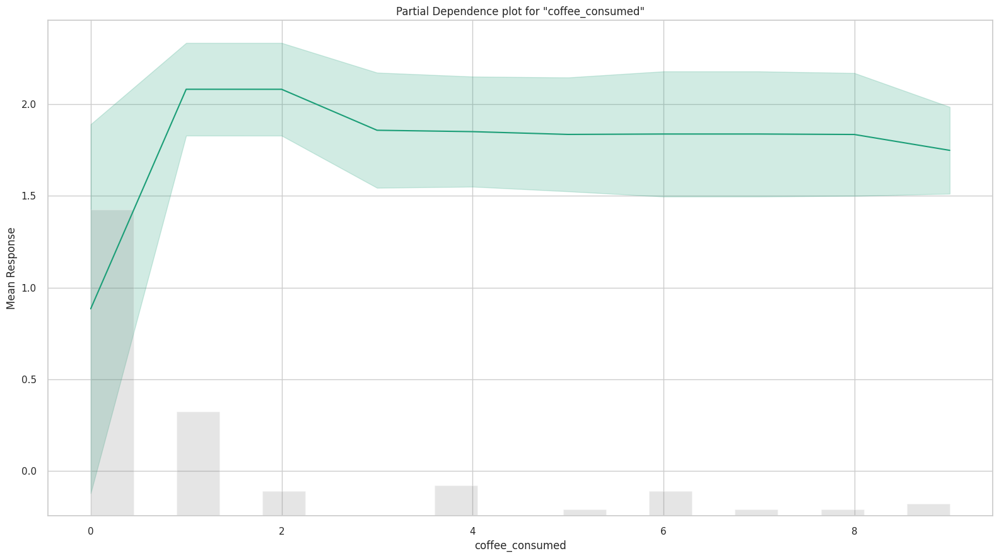

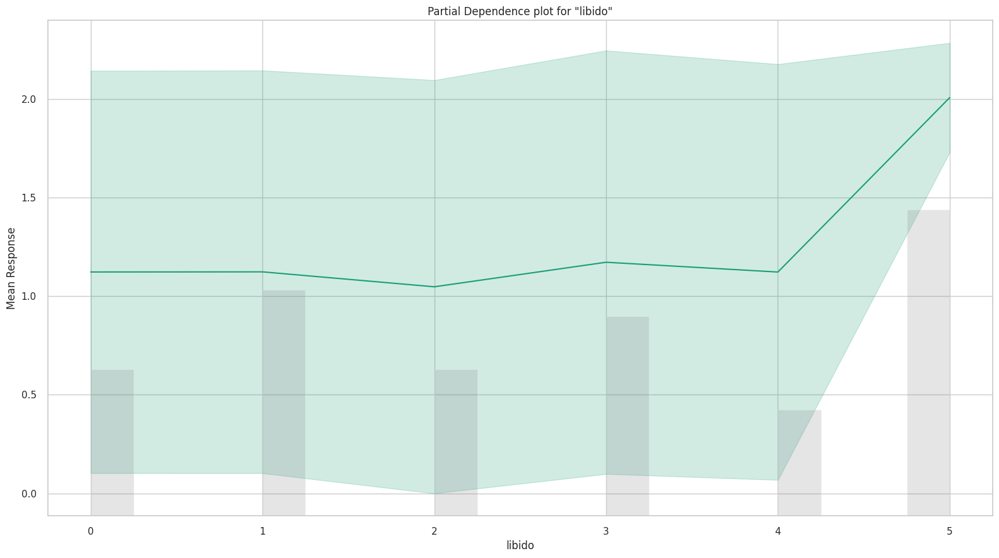

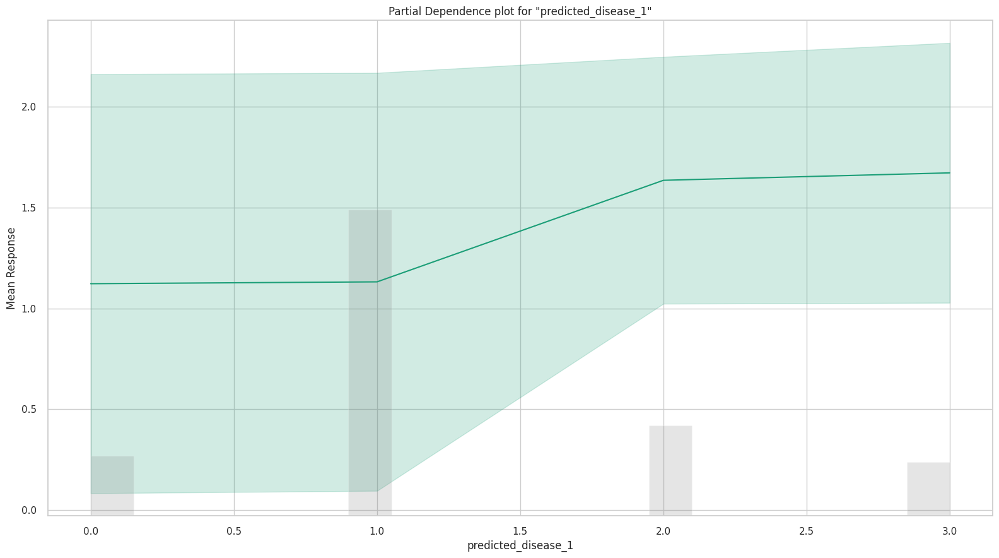

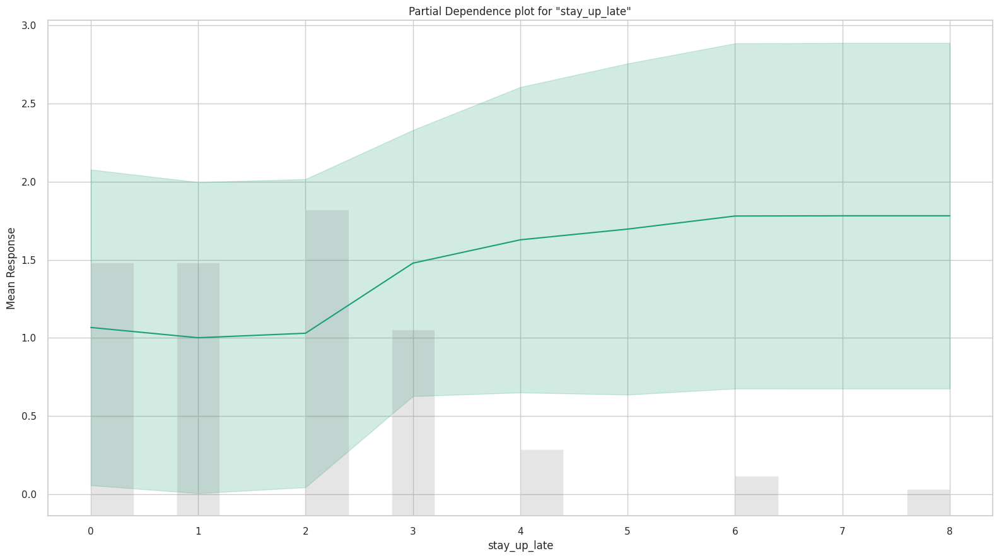

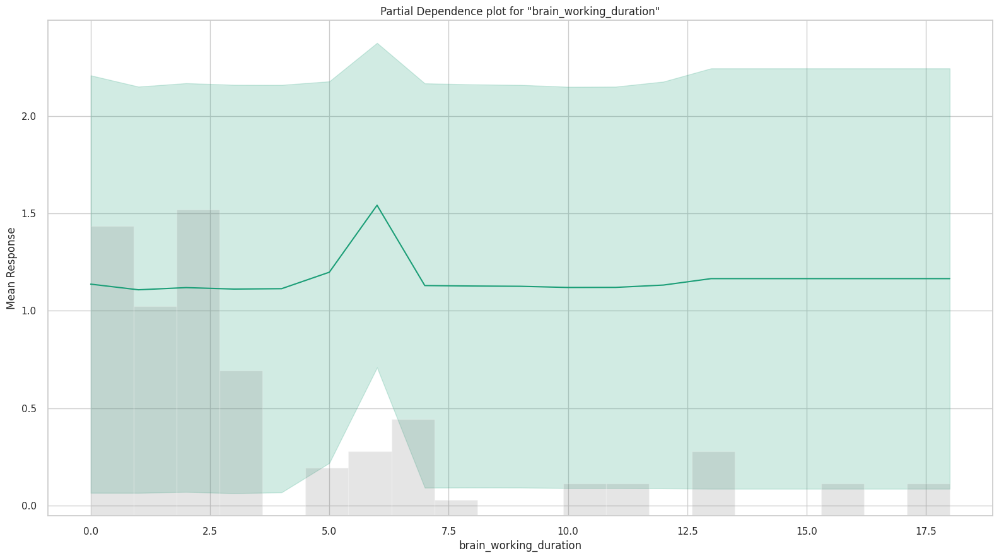

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

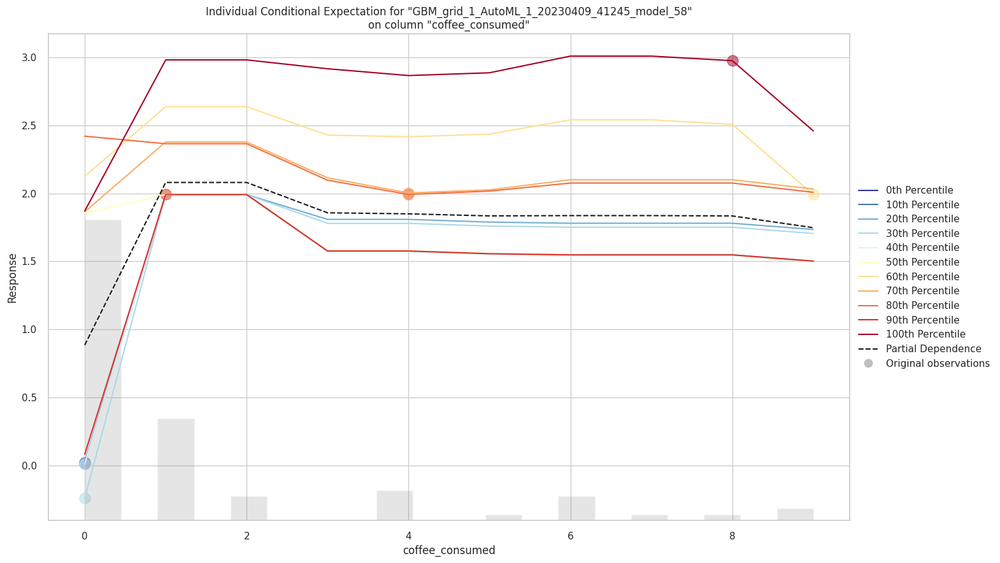

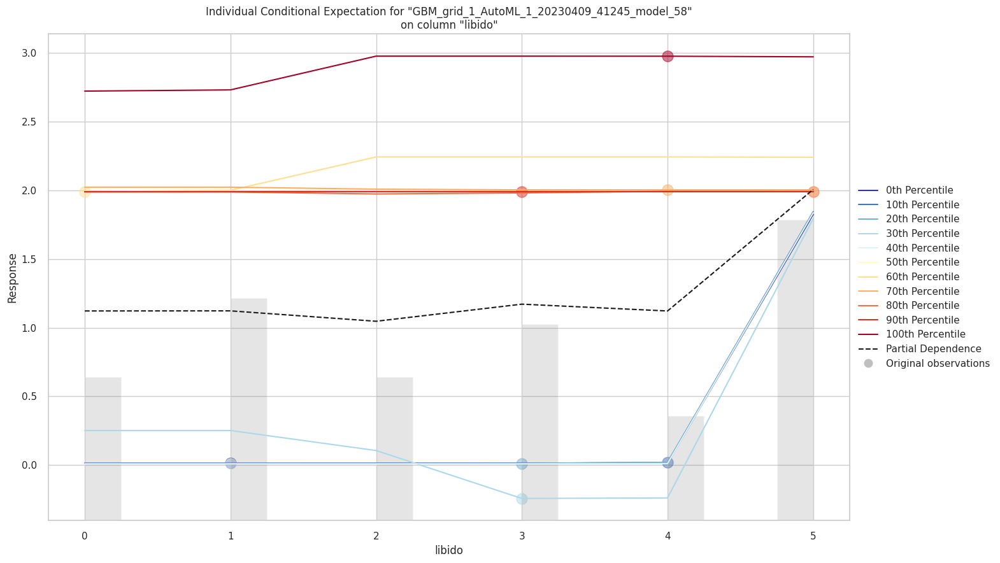

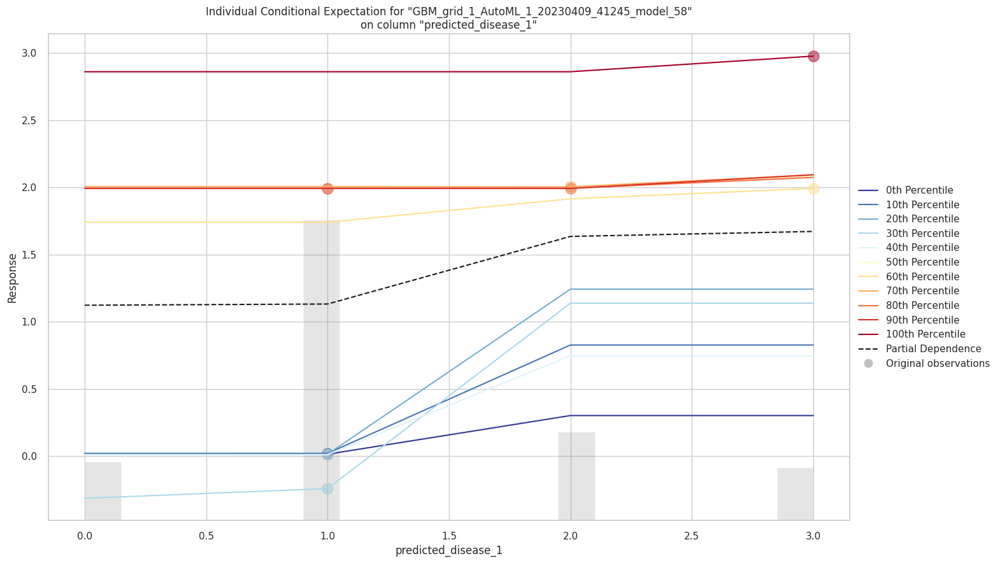

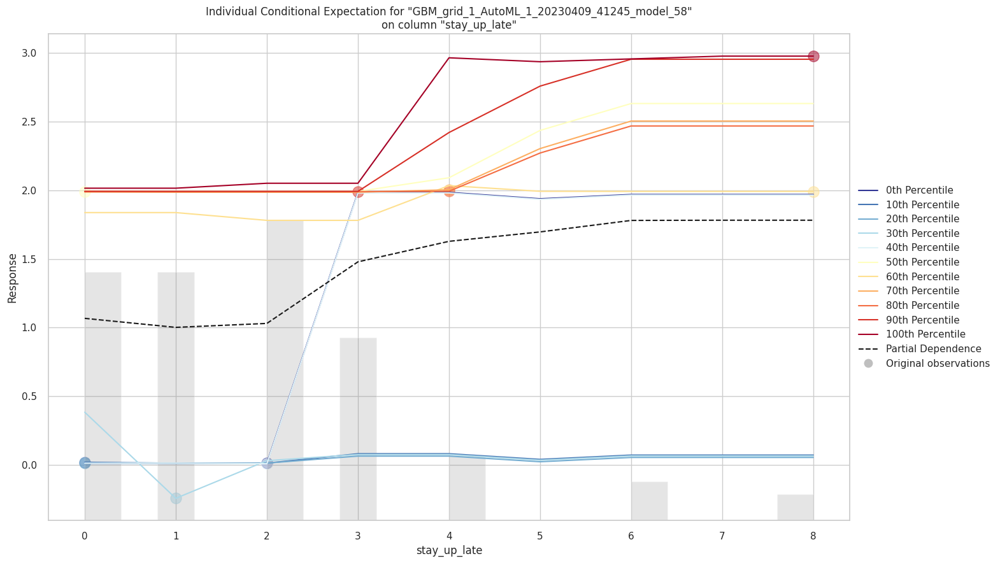

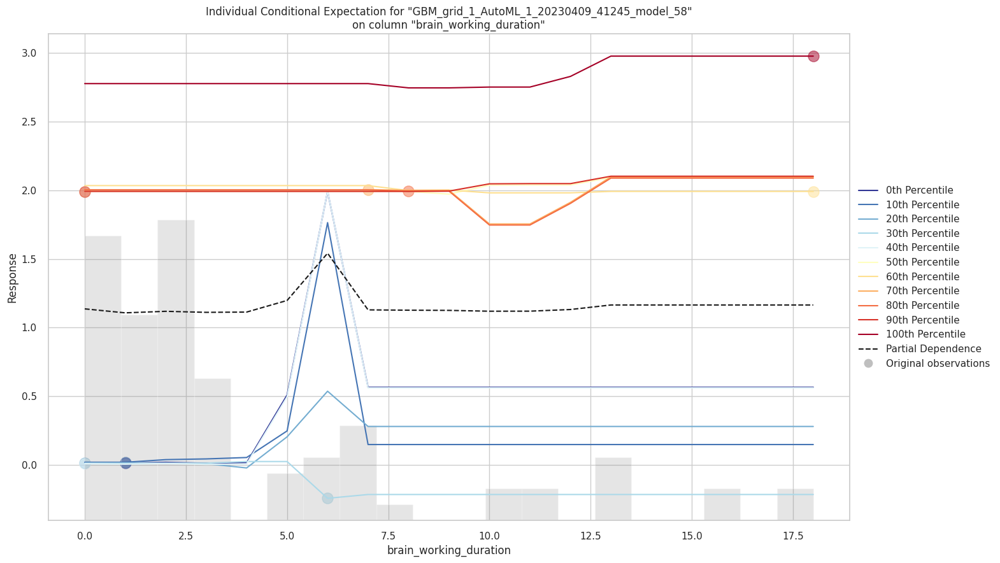

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [120]:
autoML_model.explain(autoML[1])

# **HyperParameter Tuning**

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.



In [133]:
s = imputed_data1['hair_loss']
t = imputed_data1.drop(['hair_loss'], axis = 1)

In [134]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [135]:
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

In [148]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

mode = RandomForestRegressor()
param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals, n_iter=10, scoring='accuracy', cv=5,refit=True, n_jobs=-1)

#Training and prediction

random_rf.fit(t_train, s_train)
print('Best hyperparameters:', random_rf.best_params_)

s_pred = random_rf.best_estimator_.predict(t_test)

# Calculate the Mean Squared Error
mse = mean_squared_error(s_test, s_pred)
print('Mean Squared Error:', mse)

# Calculate the Root Mean Squared Error
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

# Calculate the Mean Absolute Error
mae = np.mean(np.abs(s_test - s_pred))
print('Mean Absolute Error:', mae)

# Calculate the R-squared score
r2 = r2_score(s_test, s_pred)
print('R-squared score:', r2)

Best hyperparameters: {'n_estimators': 300, 'min_samples_split': 2, 'max_depth': 200}
Mean Squared Error: 0.11560212830530361
Root Mean Squared Error: 0.3400031298463348
Mean Absolute Error: 0.1326345238095238
R-squared score: 0.8994764101693012


## **What evaluation metric are you using?**<br>
1. The evaluation metrics which I am using are



*   Mean Squared Error
*   Root Mean Squared Error
*   Mean Absolute Error
*   Accuracy





2. These evaluation metrics are used to evaluate the best model, as it is a regression problem. Here, Accuracy are the most important metrics used to evaluate the mode.


3. Accuracy tells us how correct and precise our model is.



*   The models which gave me the best performance in predicting the level of hair loss is the model from AutoML 



# **Model Selection**


### **SHAP explanation for an Individual Person Hair Loss**
Analyzing the 10th hair loss in the dataset, please refer to the below cell for the Graph Y-axis has the features with its values from the 10th wine and X-axis has its corresponding SHAP values. This graph shows the contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying the inverse link function.

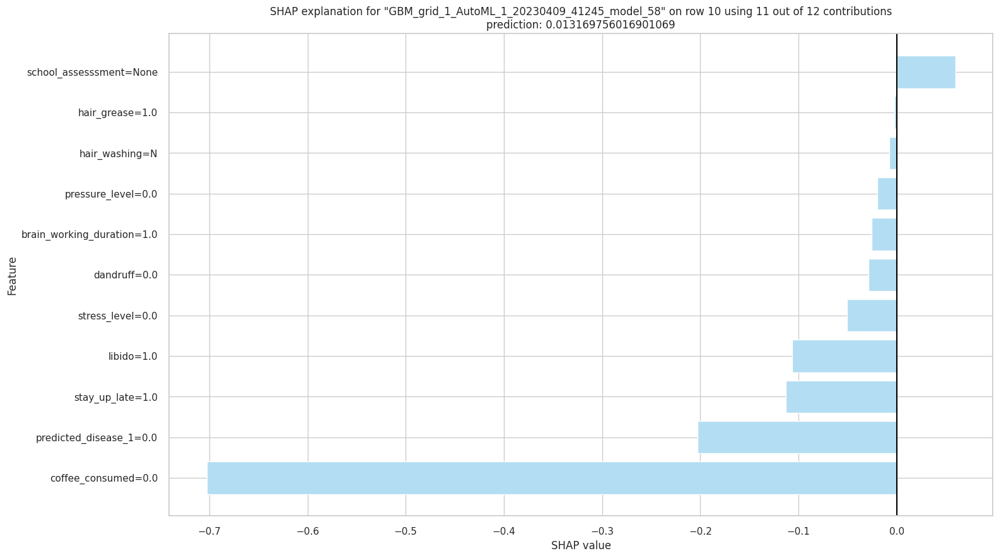

In [149]:
autoML_model.shap_explain_row_plot(
    autoML[1], 10
)  # Lets Analyze the 10th row in Test Data
     

# **SHAP Analysis for Linear and Tree-Based Models**
Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of stress_level

1. For the linear model the cross is made at approx E[f(x)] 1.3
2. For Tree-based model the cross is made at approx E[f(x)] 1.25
So as the stress_level increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 30) as an input to check the output. By plotting this we can see the difference between the model output from the expected value.

# **SHAP explanation of a Linear Model**

Exact explainer: 101it [00:12,  6.61it/s]                        


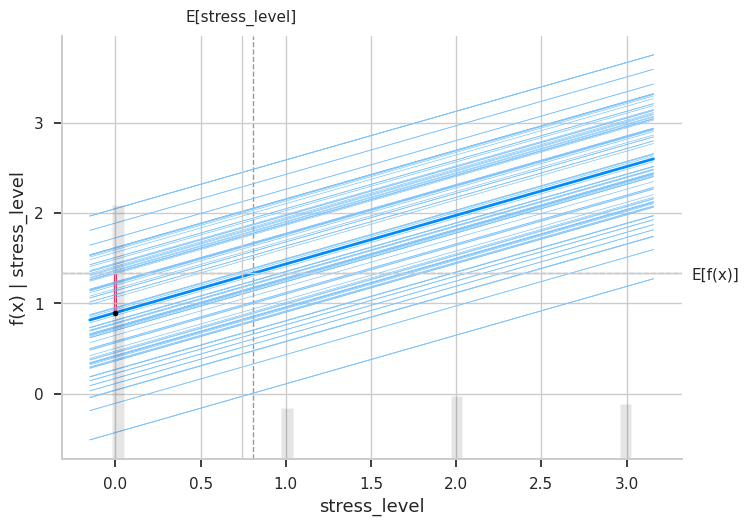

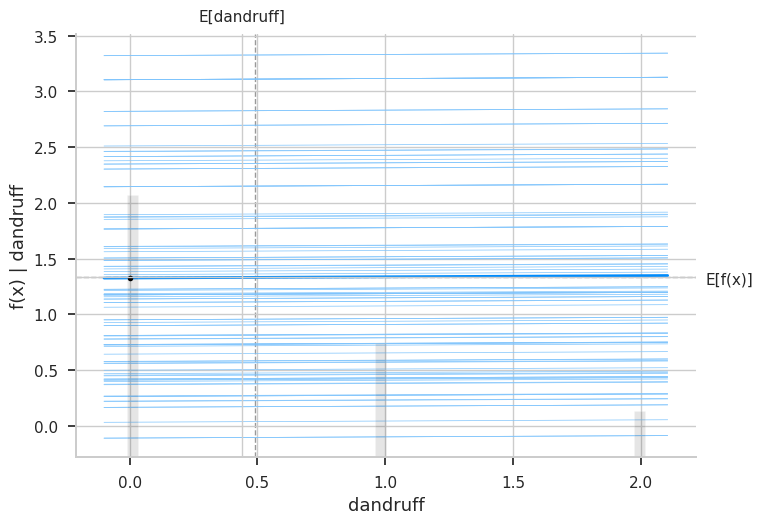

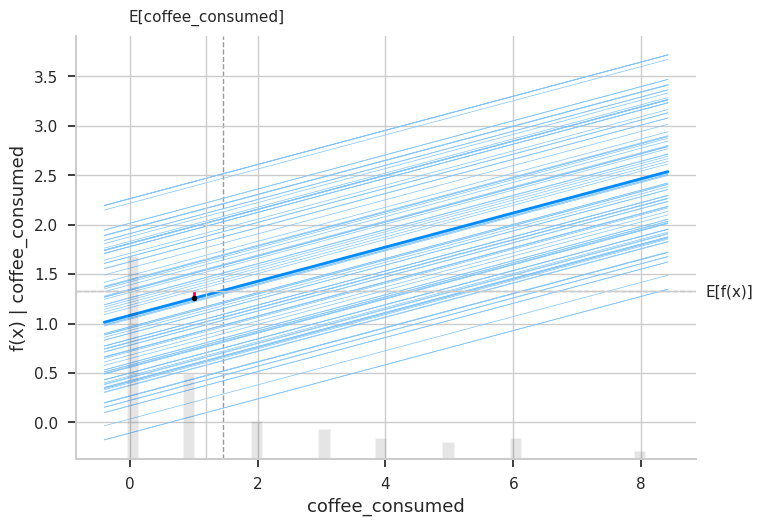

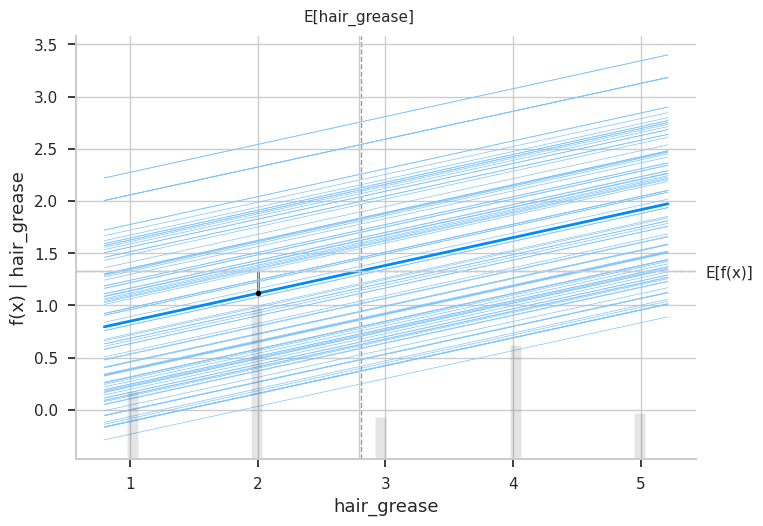

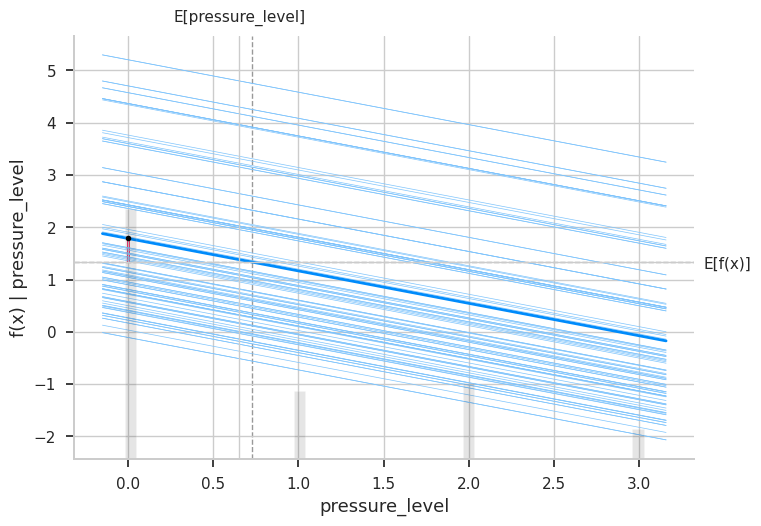

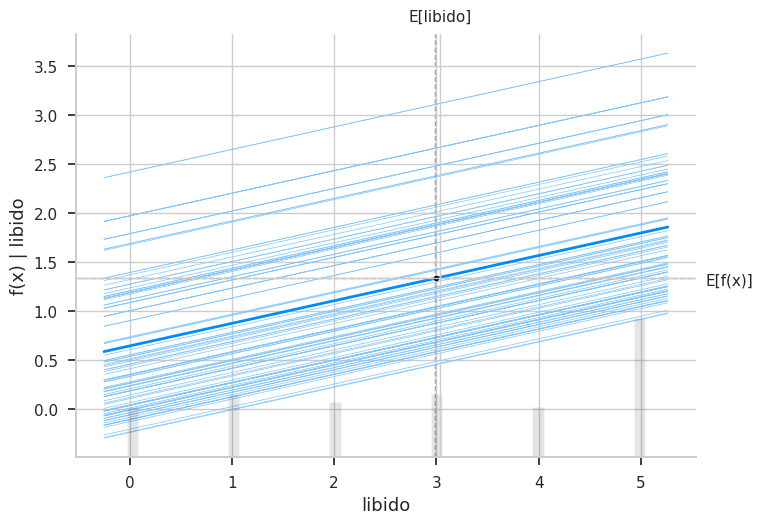

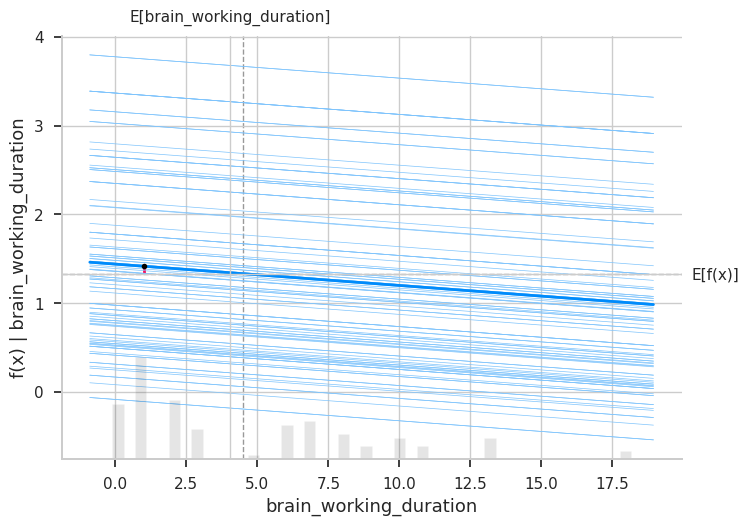

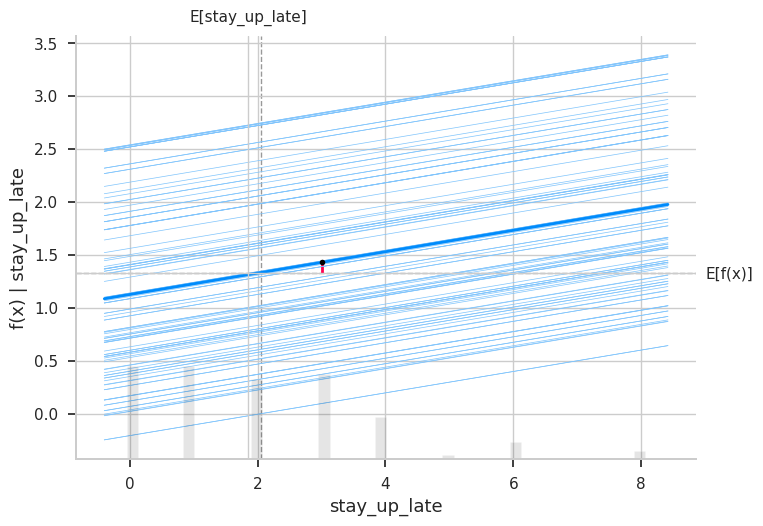

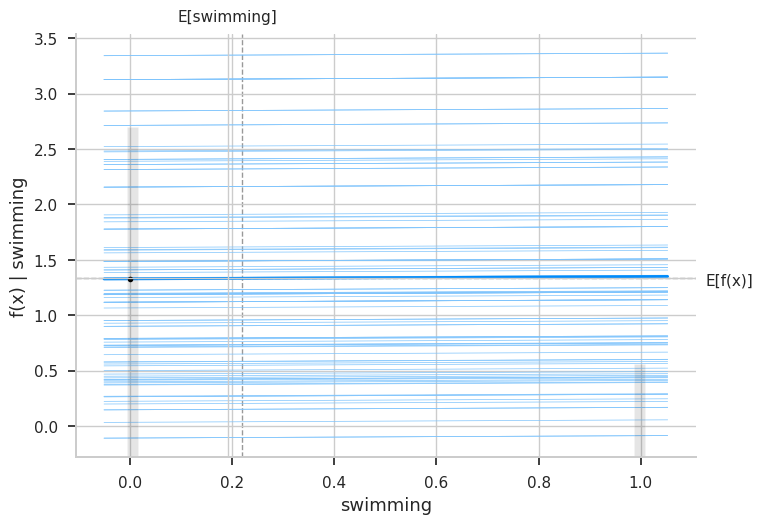

In [150]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train_100)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 30
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=True,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

# **SHAP explanation of a tree-based model**

Exact explainer: 101it [00:13,  3.61it/s]                         


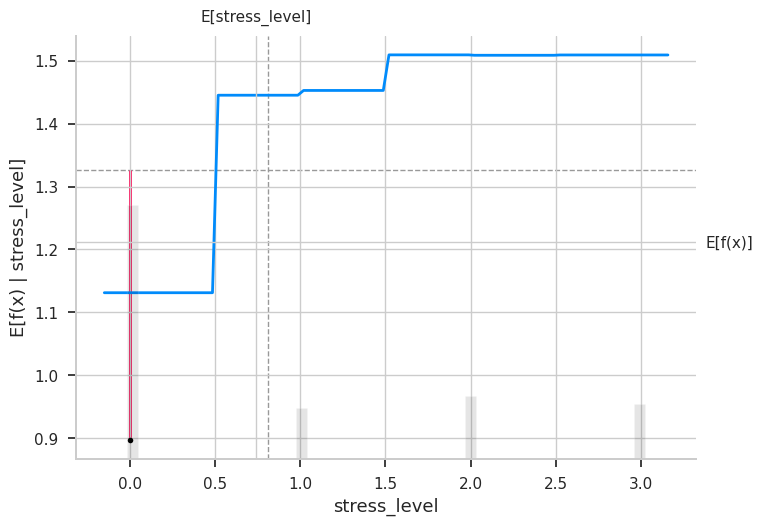

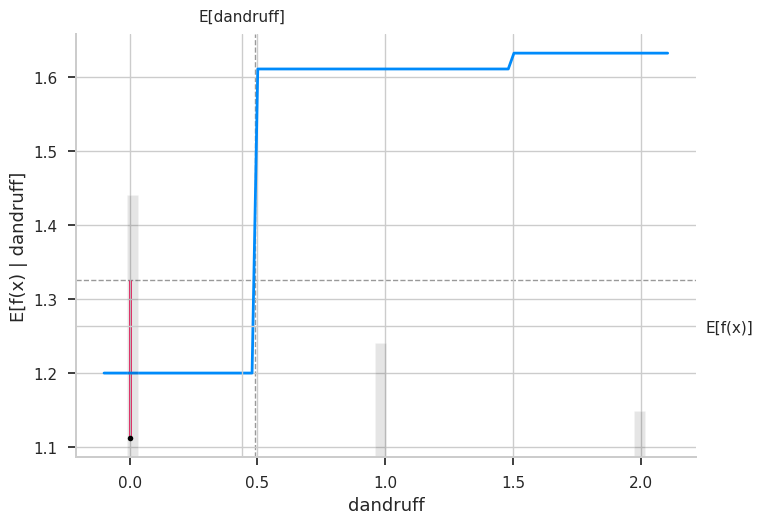

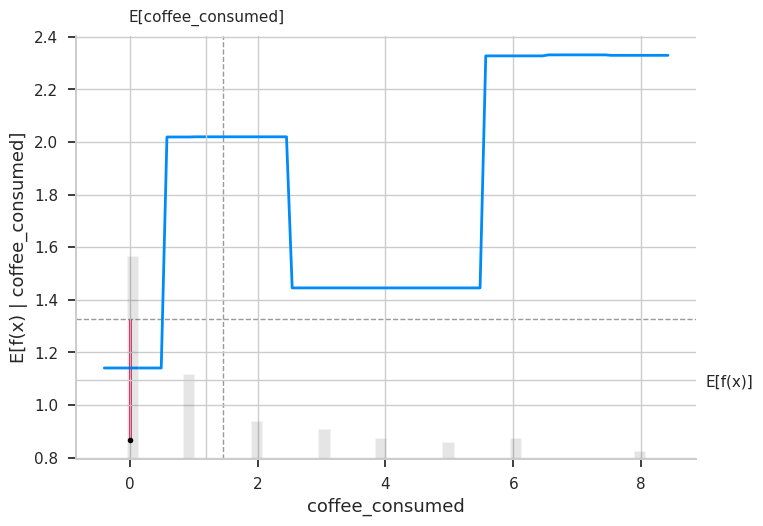

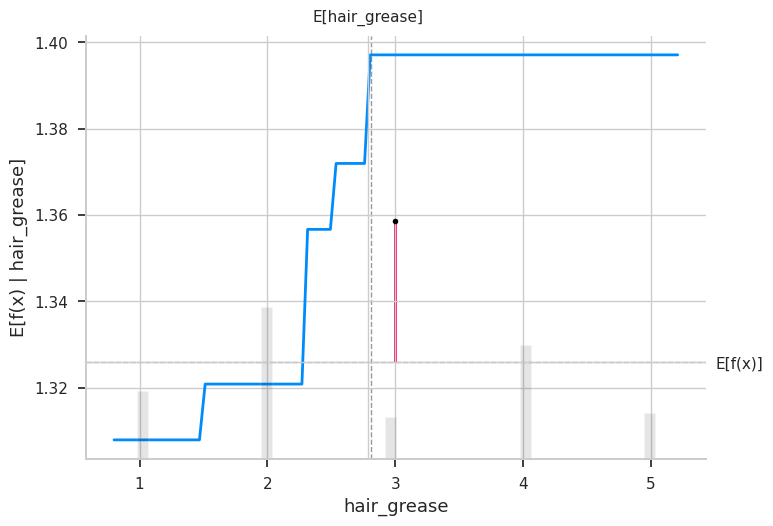

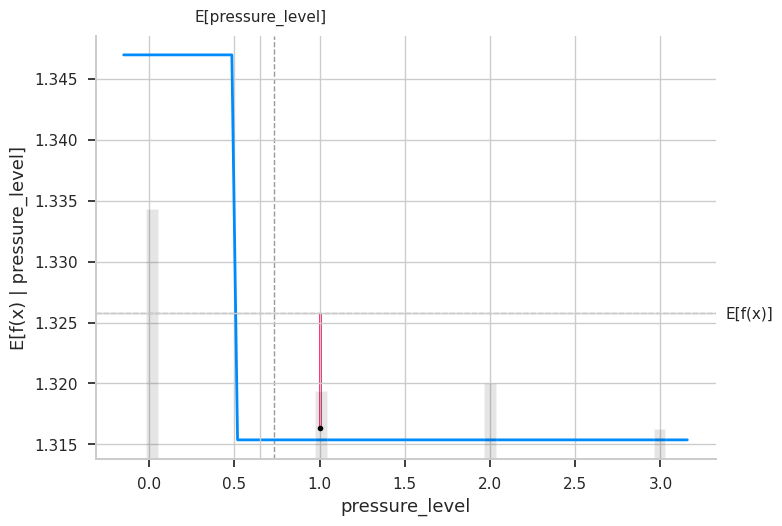

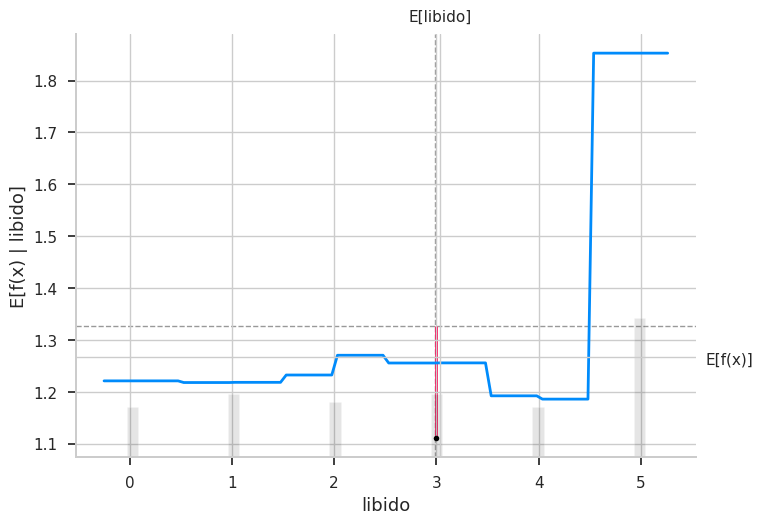

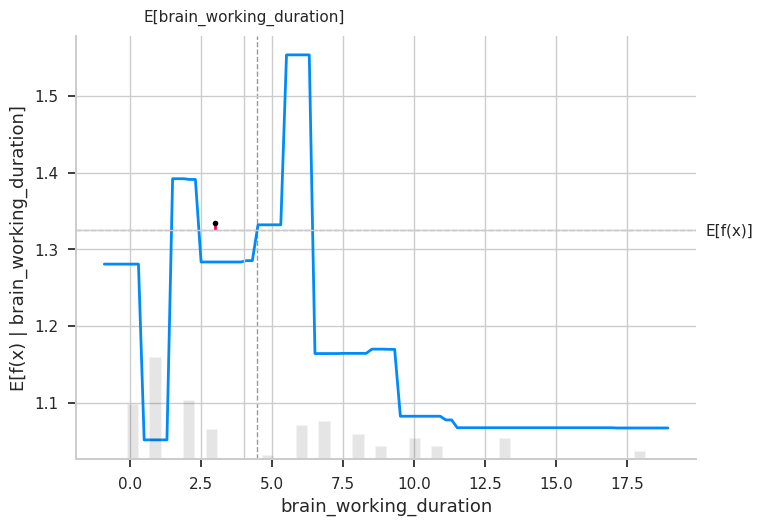

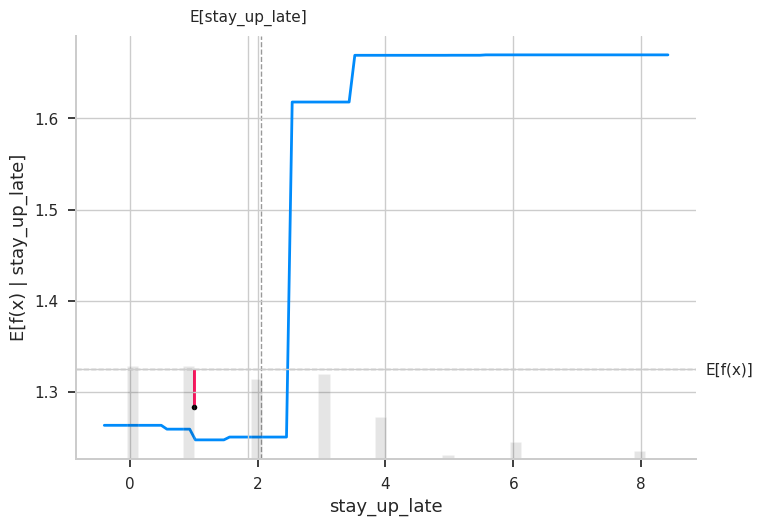

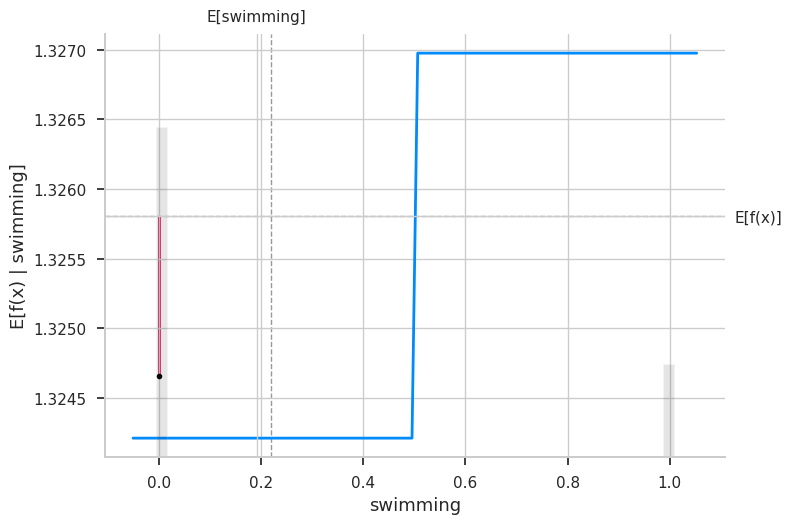

In [151]:
# SHAP explanation of a tree-based model
tree_explainer = shap.Explainer(xgb_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train_100)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        xgb_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

The following plots are

1. SHAP feature importance for a linear model
2. SHAP feature importance for tree-based model
As we can see below in the plots, there is a difference in feature importance for both the models

For the linear model, pressure_level is the most important feature but for our tree-based model coffee_consumed is the most important feature when we consider the average of SHAP values to calculate feature importance.

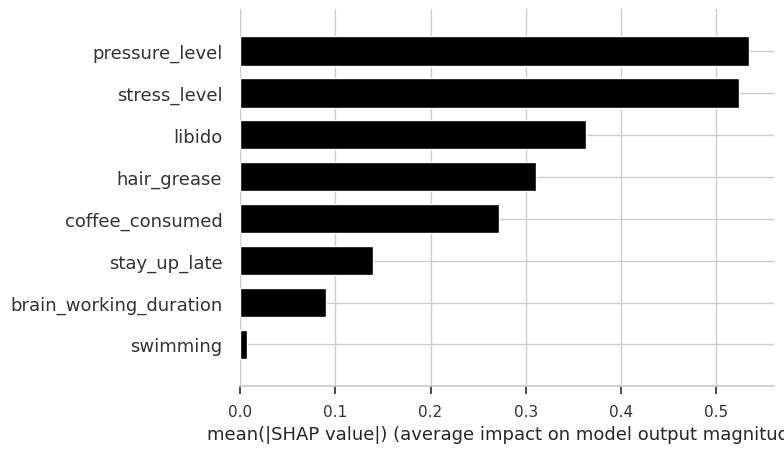

In [152]:
# SHAP variable importance for a Linear Model
plt.figure(figsize=(10, 6))
shap.summary_plot(linear_shap_values, x_train, title="Feature Importance Plot",plot_type="bar",max_display=8,sort="high-to-low", color="black")
plt.show()

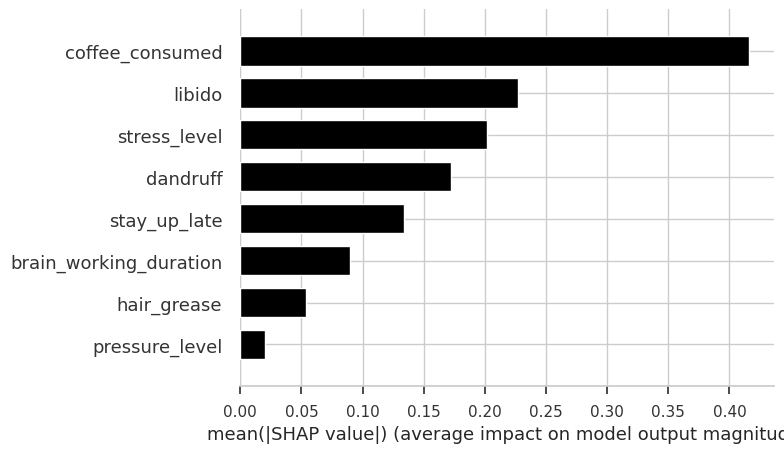

In [153]:
# SHAP variable importance for Tree based model
plt.figure(figsize=(10, 6))
shap.summary_plot(tree_shap_values, x_train, plot_type="bar",max_display=8,sort="high-to-low", color="black",title="Feature Importance Plot")
plt.show()

# **Interpreting Waterfall SHAP visualization**
1. Let's consider the same sample (sample_ind = 30)
It says that f(x) = 0.451 is what we got as a model output and the expected output for this sample was 1.333. We came close to determining it as the difference is only 0.87. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that stress_level has the  most negative impact in decreasing the level of hair_loss by 0.44 for this specific sample. Followed by coffee_consumed had a negative impact and it bought the level of hair_loss down again by 0.25 for this sample, and so on. Using this model we can visually interpret why exactly this specific sample is giving an output of 0.451.

2. Similarly we can interpret the tree-based model for the same sample.
Where the output we got was 0 and the expected output was 1.326. in the tree-based model, we just see that the magnitude of the impact made by individual features varies from what we had in a linear model. Here in the tree-based model, the output is majorly determined by only three features - stress_level, coffee_consumed, libido and dandruff, whereas in the linear model stress_level, coffee_consumed, pressure_level, stay_up_late,hair_grease these features had maximum impact.

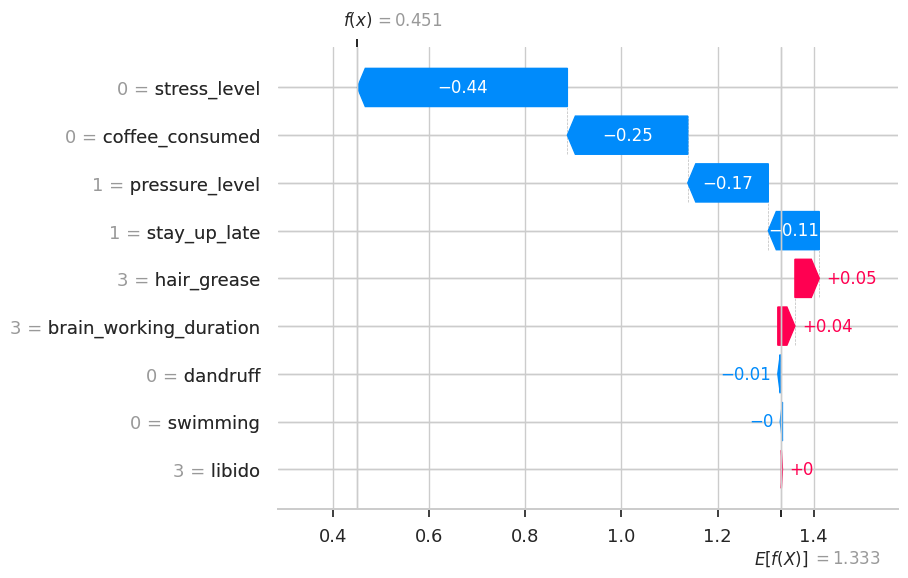

In [154]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)


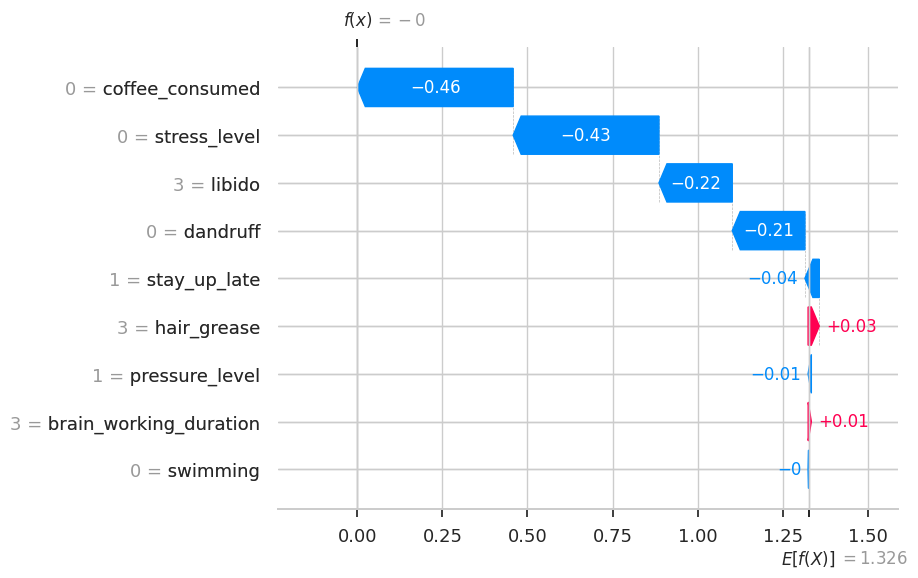

In [155]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

# **Interpret the summary plot for the Linear and Tree-based model**

The feature importance plot shows the descending order of features based on their impact on the target variable. The impact of each feature is represented by a dot on the plot, where the red color indicates high values and the blue color indicates low values. If a dot lies to the right of the y-axis, it signifies a positive impact, whereas a dot on the left side of the axis represents a negative impact of the feature on the target variable.

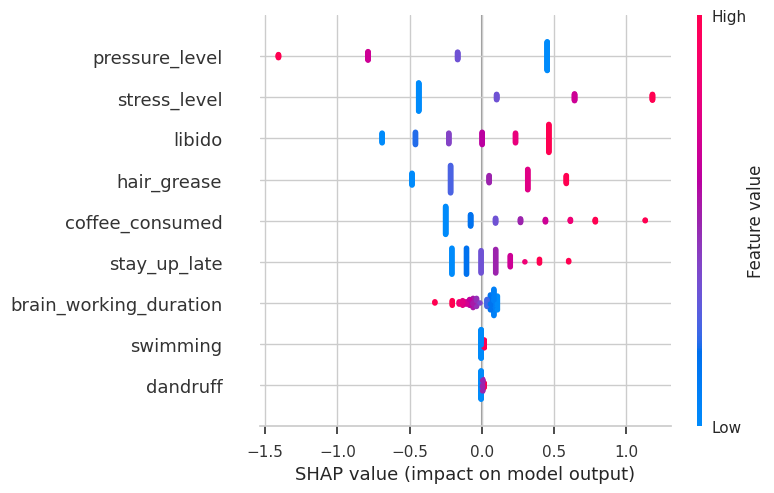

In [156]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train_100)

Let us try to understand how both models are performing side by side

Higher value of libido tends to have a positive impact on the hair_loss
Higher values of coffee_consumed tend to have a positive impact on the hair_loss.
Lower values of pressure_level tends to have a positive impact on the hair_loss
Lower value of pressure_level tends to have a positive impact on the quality of wine, and so on.


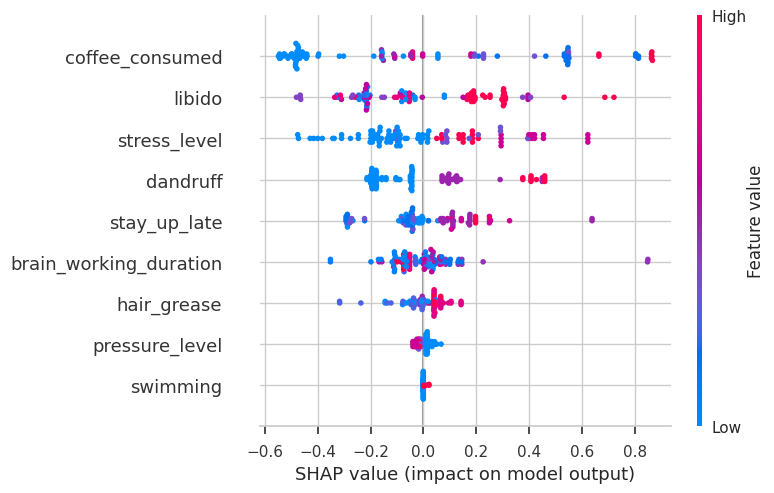

In [157]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train_100)

# **Interpreting SHAP dependence plot** 
The SHAP dependence plot illustrates the impact of one or two features on the predicted outcome of a machine learning model. It helps determine the nature of the relationship between the target and a feature.

In the linear model SHAP dependence plot, there is a linear relationship between the feature and its SHAP value. If a feature positively affects hair_loss, the relationship is directly proportional (e.g. coffee_consumed and pressure_level), and if a feature negatively affects hair_loss, the relationship is inversely proportional (e.g. pressure_level and stay_up_late).

Example of SHAP dependence plot of stress_level

1. The SHAP dependence plot shows a linear relationship between the stress_level feature and its SHAP values in the linear model. The direction of the relationship, whether it is direct or inverse, can also be determined from the plot.
2. The tree-based model allows us to understand the impact of each feature on hair_loss through tuning, and confirms the conclusions drawn from the PDP and ICE plots.


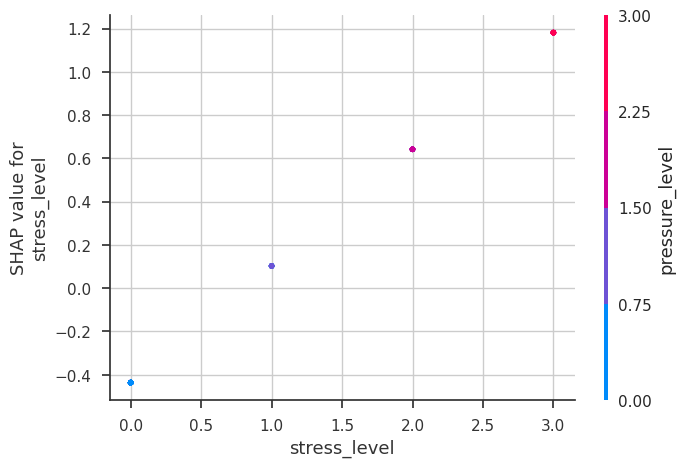

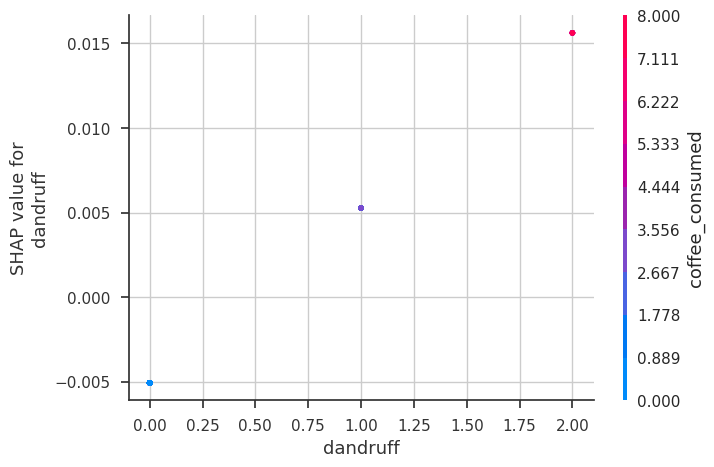

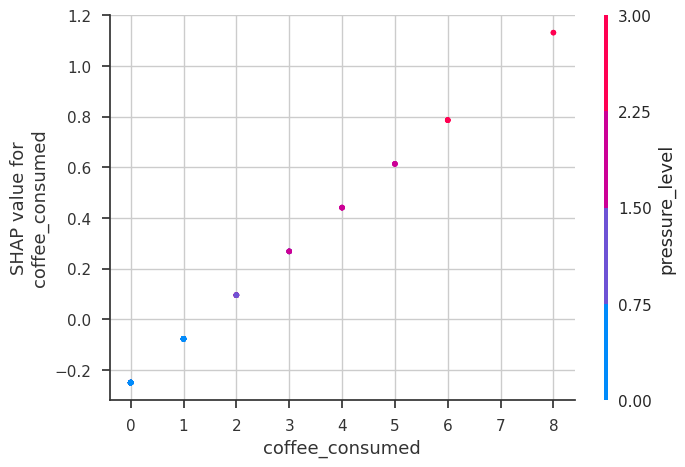

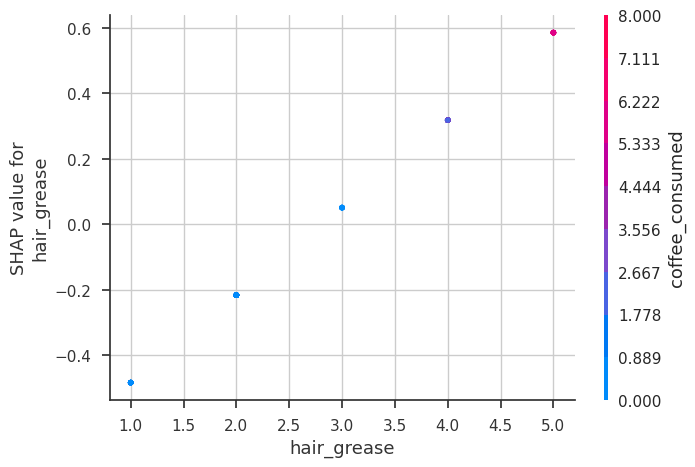

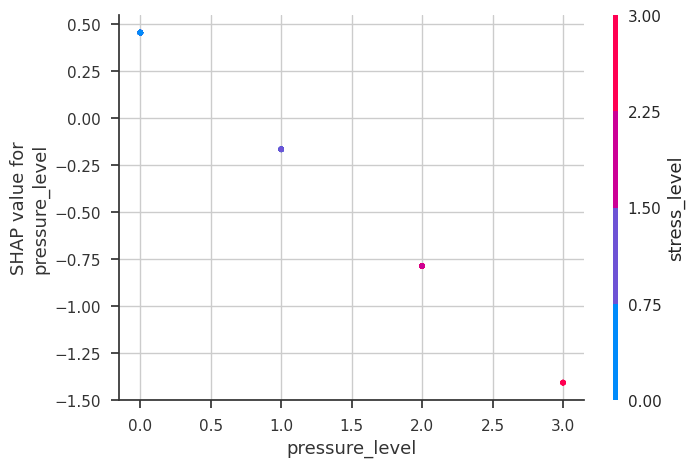

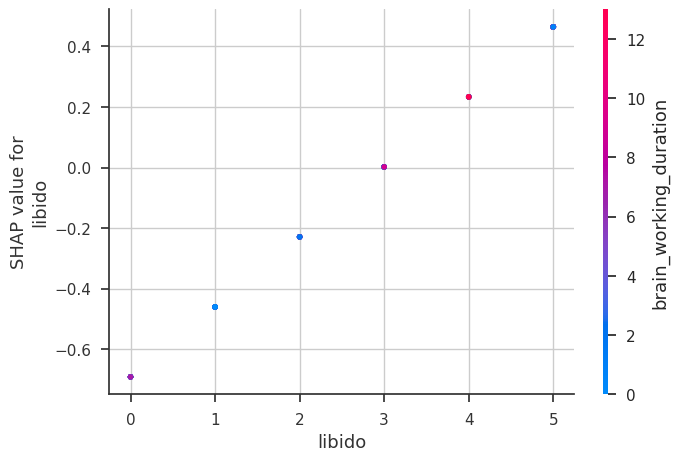

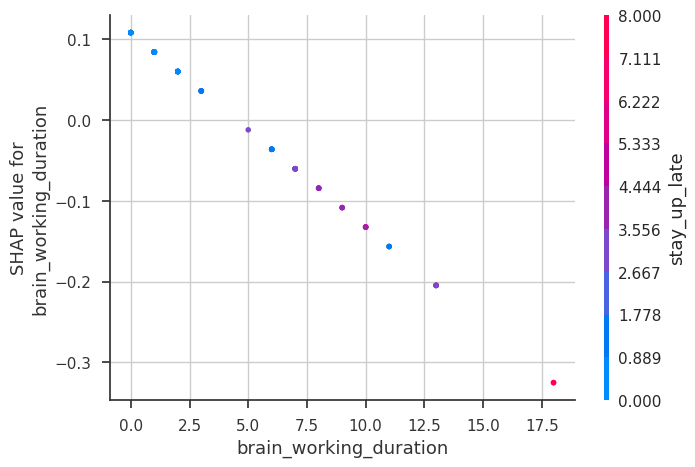

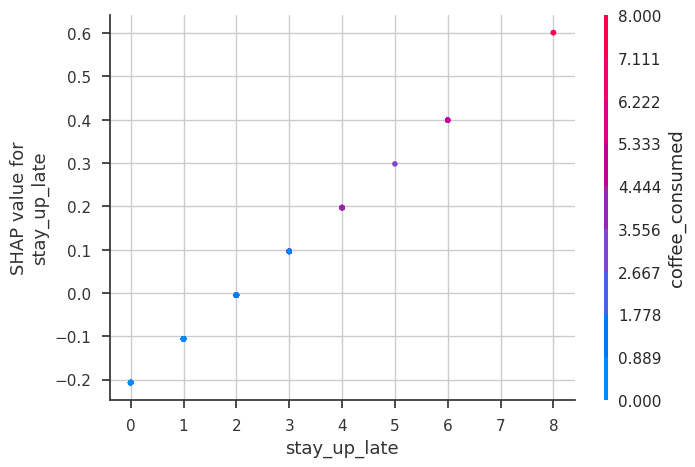

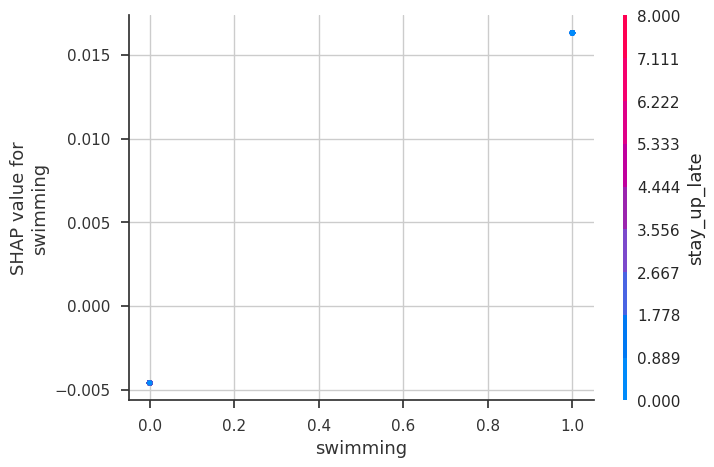

In [158]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train_100)

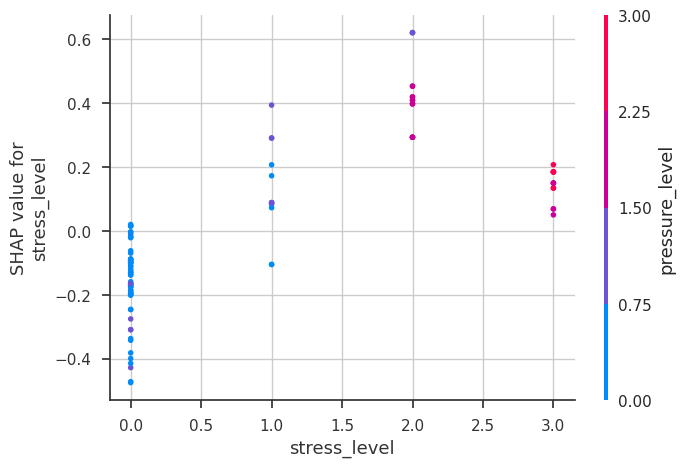

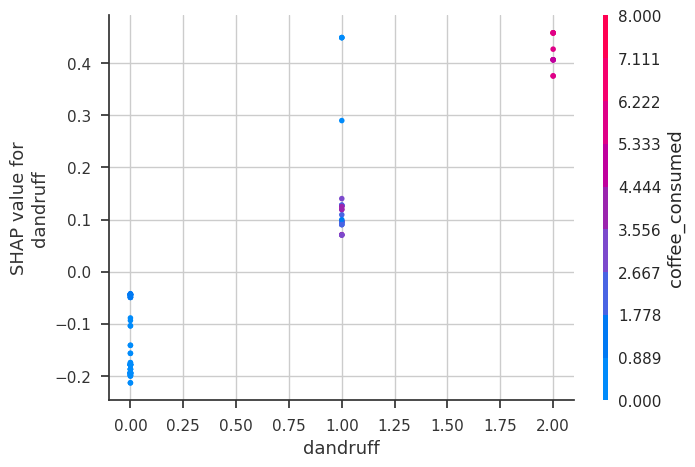

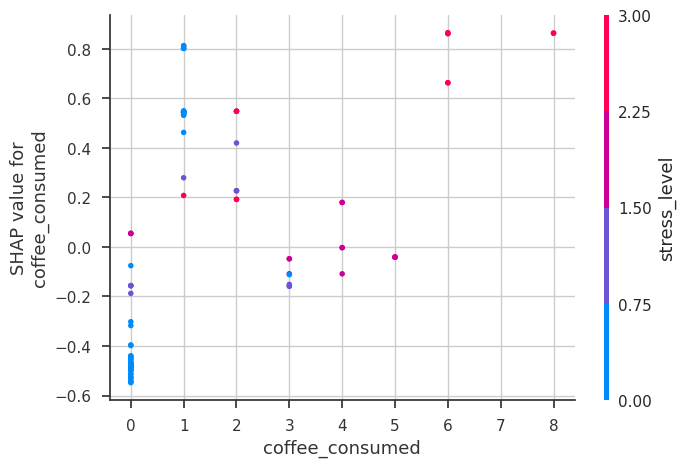

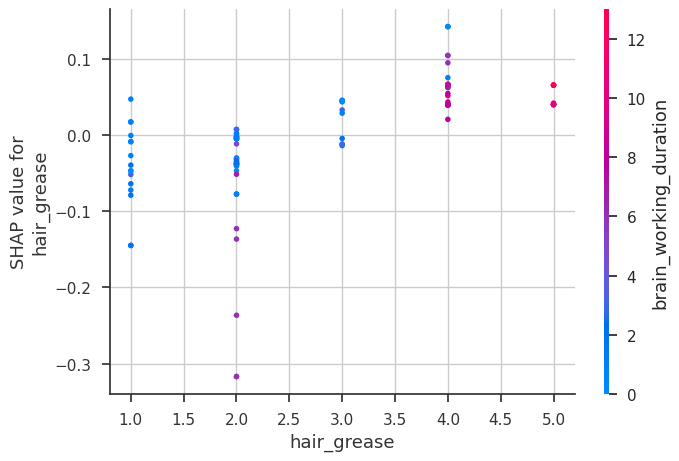

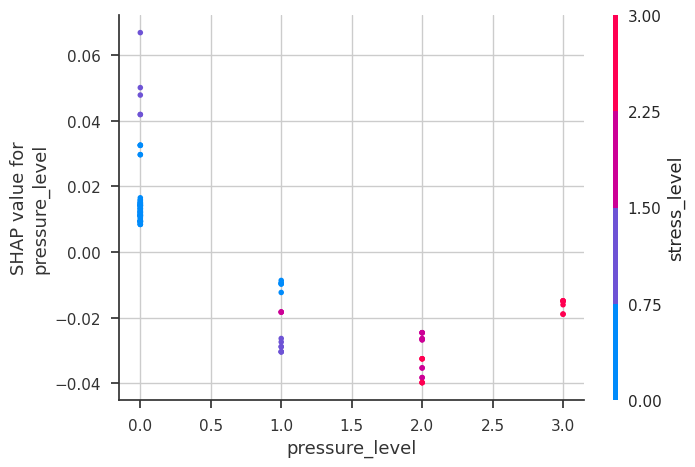

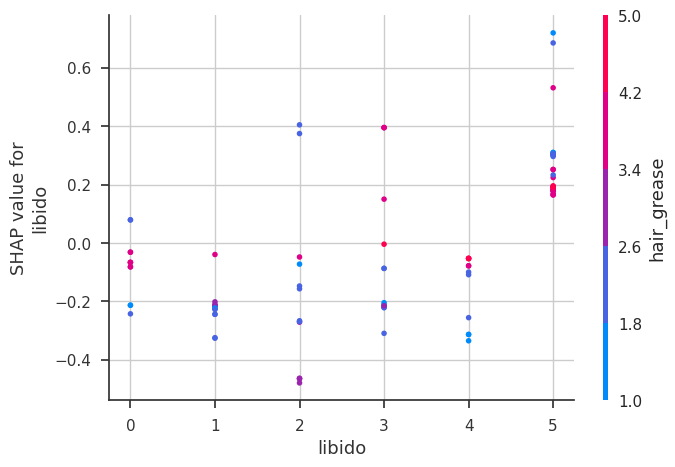

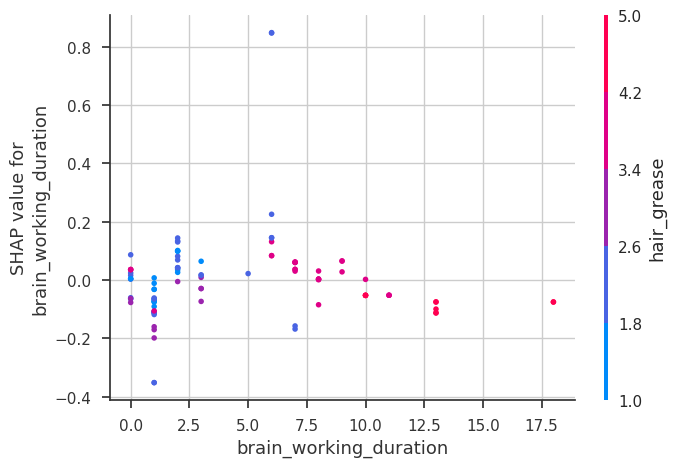

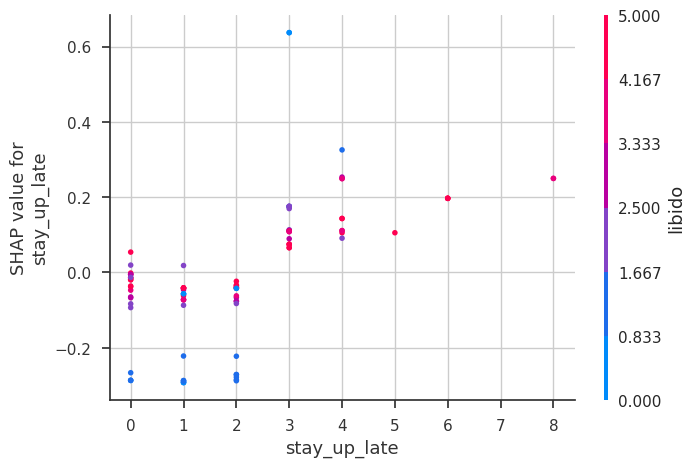

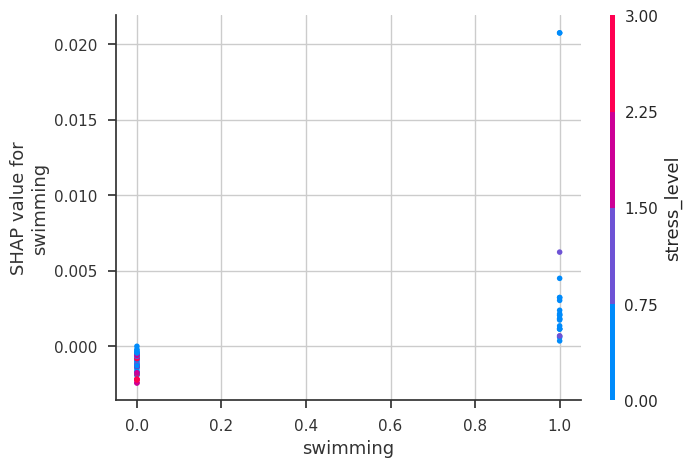

In [159]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train_100)

In [160]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    xgb_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

# **Heatmap Visualization**
1. This visualization provides a summary of how each data point in every feature is impacting the target variable, hair_loss. The Y-axis represents the features, while the X-axis represents instances of that feature. 
2. The color of the instance represents whether it has a positive or negative effect, with red indicating a positive effect and blue indicating a negative effect. 
3. The intensity of the color corresponds to the intensity of the effect, with deeper colors indicating a more impactful feature.

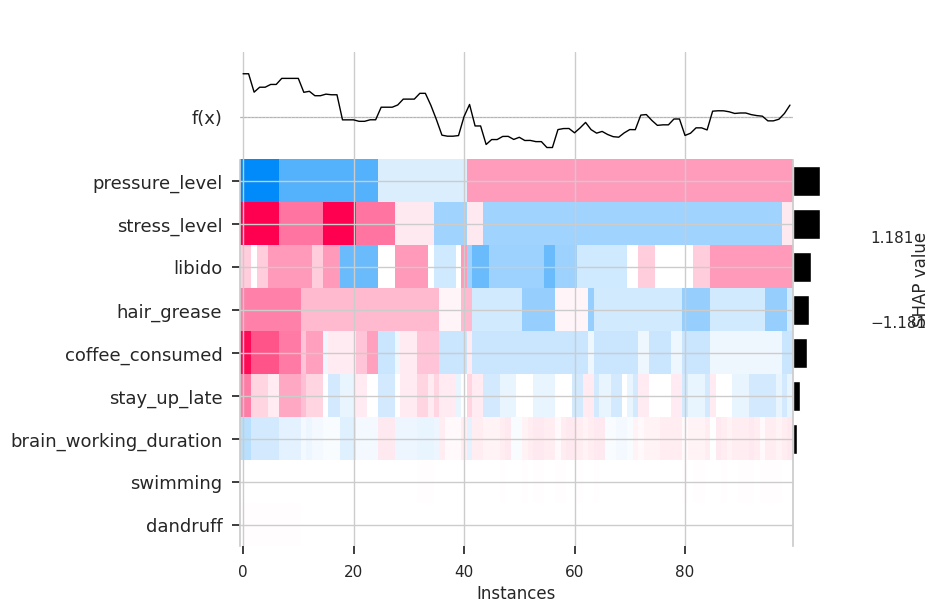

In [161]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

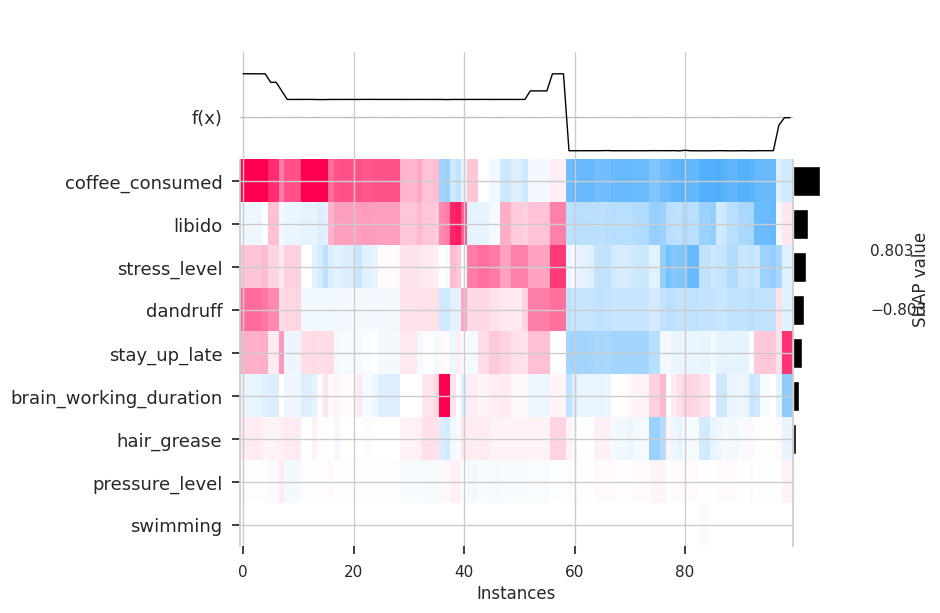

In [162]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

# **Interpreting AutoML's best model with tuned hyperparameters**
**How are errors/residuals distributed and how interpretable is your model ?**
1. **Residual Analysis**

*   Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

2. **Variable Importance**

*   In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding.

3. **Shap Summary**
*   The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.

4. **ICE (Individual Conditional Expectation) Plot**

*   ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value.

5. **Partial Dependence Plot (PDP)**

*   A partial dependence plot shows the marginal effect of a feature on the target(hair loss in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.


# **LIME (Local Interpretation Model-Agnostic Explanation) Analysis**
LIME creates a simpler model (e.g. linear) to interpret a more complex model (e.g. tree-based) at specific data points. It approximates the simple model to the whole model. LIME is effective on various types of datasets such as tabular, text, and image.

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 30) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

1. As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
2. Here for this sample as seen below stress_level,coffee_consumed,hair_grease etc had a positive effect on the hair_loss in both models
pressure_level,libido,brain_working_duration, had a negative effect in the linear model but positive in tree-based model
3. These interpretations were carried out locally in the region where of out sample data(sample_index = 30).

In [163]:
# Initializing LIME explainer for Linear Model
from lime import lime_tabular

lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [164]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [2.3153839]
Actual :      2


In [165]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook


In [166]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [167]:

# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", xgb_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], xgb_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [2.001352]
Actual :      2


In [168]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook


# **Comparison between SHAP and LIME Analysis**
Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

# **Conclusion:-**
The best model identified by AutoML, with its hyperparameters tuned, achieved the highest accuracy among all models tested in this exercise and is therefore considered optimal for this task. Furthermore, this model is interpretable, allowing us to understand the underlying factors that contributed to its predictions.

# **Learning Outcomes**
1. I learned the complete lifecycle of a Data Science project right from data prepartion to hyperparameter tuning
2. Majority of the time should be invested in data preparation i.e. cleaning the data, normalizing, feature selection, imputation etc

3. Hyperparameter tuning is the second most important thing after data preparation, which most of the practioner's ignore. But the results are worth the time invested
4. Multiple models must be trained and the best models should be selected to be deployed, as some algorithms perform much better than the other's on specific tasks
5. Model Interpretation(Unboxing the Black Blox) is the best takeaway from the series of this assignments. SHAP, LIME and PDP have made it easier to understand what made a model to predict a outcome.

# **Questions:-**

---
**1. What is the question?**

The objective of this problem is to predict the level of hair loss in individuals using features such as sleep habits, coffee consumption, and hair grease. While the typical approach for this problem is to classify the hair loss levels into four discrete categories, this may not accurately reflect the true differences between adjacent classes. By reframing this problem as a regression task, we can capture the actual differences in hair loss levels and provide a more accurate and fine-grained prediction of hair loss. This can improve the accuracy and fairness of our predictions and provide a better understanding of the relationship between input features and the level of hair loss.

---
**2. What did you do?**

To accomplish the objective of predicting the level of hair loss in individuals using certain features, I experimented with multiple machine learning models. The models that I trained for this purpose included a simple Linear Regression model, an XG Boost Regressor, and an AutoML model. These models were trained using the available data to learn the relationship between the input features and the target variable (i.e., the level of hair loss). Once trained, the models were evaluated to assess their performance in accurately predicting the hair loss levels. By experimenting with multiple models, I aimed to find the best model that could accurately predict the hair loss levels given the input features.

---

**3. How well did it work?**

A automl model was developed to predict hair loss, taking into consideration VIF, p-values, and other tests to eliminate some of the independent variables. The H20.ai framework was utilized to train and test the Luke Hair Loss Dataset variables, with the best-performing model being 'gbm,' with a test data accuracy of 89.9%. The results demonstrate that the linear regression model proposed can effectively analyze and predict hair loss to some degree. However, the prediction accuracy is still limited in some areas, and further research is needed to enhance the model. Techniques such as outlier removal and using ensemble or booster methods could help to improve the model's prediction accuracy in future studies.

---

**4. What did you learn?**

In this project, I gained hands-on experience with the complete lifecycle of a Data Science project, from data preparation to hyperparameter tuning. I discovered that data preparation, including cleaning, normalization, feature selection, and imputation, is crucial for achieving good results. Hyperparameter tuning is also critical, and it's worth investing time in to achieve better results. Additionally, I trained multiple models, comparing their performance to select the best one for deployment, as different algorithms perform better on specific tasks. The most important takeaway from this project was model interpretation, using techniques like SHAP, LIME, and PDP, which provide a better understanding of the model's decision-making process.

---


# **References**
1. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb
2. SHAP (SHapley Additive exPlanations) documentation: https://shap.readthedocs.io/en/latest/
3. Christoph Molnar's "Interpretable Machine Learning" book, Chapter 5: https://christophm.github.io/interpretable-ml-book/shapley.html
4. “An Introduction to SHAP (SHapley Additive exPlanations) Values in Python”, by Will Koehrsen (2019): https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
5. “Interpretable Machine Learning with XGBoost”, by Ando Saabas (2016): https://towardsdatascience.com/interpretable-machine-learning-with-xgboost-9ec80d148d27

# **LICENSE**

MIT License

Copyright (c) 2023 Poornachandra Kongara



Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

<br>

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

<br>



THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.